In [3]:
import pandas as pd

data = pd.read_excel("Data\Monthly Returns.xlsx")
data = data.pivot(index='Trading Month', columns='Stock Code', values='Monthly Return Without Cash Dividend Reinvested')

data.head()

Stock Code,600010,600028,600030,600031,600036,600048,600050,600089,600104,600111,...,601899,601919,603259,603260,603288,603501,603799,603986,688111,688599
Trading Month,,,,,,,,,,,,,,,,,,,,,
2010-01,-0.131466,-0.189496,-0.109852,-0.162184,-0.159557,-0.149107,-0.035665,-0.097479,-0.229621,-0.156090,...,-0.139004,-0.061151,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-02,0.029777,-0.011384,-0.033946,0.060311,0.048121,0.044596,-0.044097,0.022346,0.092896,0.103717,...,0.026506,-0.017625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03,0.019277,0.038973,0.040264,0.037003,0.078219,0.039176,-0.065476,-0.058288,-0.069545,0.098669,...,-0.037559,-0.007020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-04,-0.073286,-0.140665,0.018297,-0.176644,-0.123464,-0.219188,-0.062102,-0.073501,-0.079140,0.270135,...,-0.023171,-0.043205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-05,-0.135204,-0.144841,-0.315826,-0.029728,-0.072880,-0.105263,-0.130730,-0.079332,-0.118302,0.149551,...,-0.113608,-0.186371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [2]:
non_nan_counts = data.count()
mask = non_nan_counts > 120

filtered_columns = non_nan_counts[mask].index.tolist()
data = data[filtered_columns]

data.index = pd.to_datetime(data.index, format="%Y-%m")
data.index = data.index.to_period('M')
data.head()



Stock Code,600010,600028,600030,600031,600036,600048,600050,600089,600104,600111,...,601390,601398,601628,601633,601668,601669,601857,601888,601899,601919
Trading Month,,,,,,,,,,,,,,,,,,,,,
2010-01,-0.131466,-0.189496,-0.109852,-0.162184,-0.159557,-0.149107,-0.035665,-0.097479,-0.229621,-0.156090,...,-0.092063,-0.108456,-0.146418,NaN,-0.097458,NaN,-0.053546,-0.104107,-0.139004,-0.061151
2010-02,0.029777,-0.011384,-0.033946,0.060311,0.048121,0.044596,-0.044097,0.022346,0.092896,0.103717,...,0.012238,0.004124,-0.002588,NaN,0.021127,NaN,-0.006116,-0.003731,0.026506,-0.017625
2010-03,0.019277,0.038973,0.040264,0.037003,0.078219,0.039176,-0.065476,-0.058288,-0.069545,0.098669,...,0.001727,0.022587,0.055597,NaN,-0.002299,NaN,-0.012308,-0.000535,-0.037559,-0.007020
2010-04,-0.073286,-0.140665,0.018297,-0.176644,-0.123464,-0.219188,-0.062102,-0.073501,-0.079140,0.270135,...,-0.106897,-0.088353,-0.067065,NaN,-0.092166,NaN,-0.057632,0.037473,-0.023171,-0.043205
2010-05,-0.135204,-0.144841,-0.315826,-0.029728,-0.072880,-0.105263,-0.130730,-0.079332,-0.118302,0.149551,...,-0.119691,-0.024229,-0.092586,NaN,-0.088832,NaN,-0.103306,-0.102683,-0.113608,-0.186371


In [6]:
non_na_dates = data.apply(lambda col: col.first_valid_index())

latest_start_date = non_na_dates.max()

data = data.loc[latest_start_date:]
data = data.fillna(method='bfill')
data.head()

Stock Code,600010,600028,600030,600031,600036,600048,600050,600089,600104,600111,...,601390,601398,601628,601633,601668,601669,601857,601888,601899,601919
Trading Month,,,,,,,,,,,,,,,,,,,,,
2012-05,0.054726,-0.041783,0.059231,0.057325,-0.044262,0.090328,-0.053118,-0.018657,0.022107,0.250528,...,0.010989,-0.034325,-0.042881,0.143145,-0.005917,0.006550,-0.048338,-0.062241,-0.044186,-0.045198
2012-06,-0.229068,-0.056886,-0.082789,-0.068273,-0.027444,0.013416,-0.092683,-0.133163,-0.090967,-0.107240,...,-0.068841,-0.015877,0.064331,0.065230,0.017857,-0.052061,-0.024910,0.044248,-0.055961,-0.084813
2012-07,0.024590,-0.039683,-0.032462,-0.144397,-0.091575,0.005291,-0.034005,-0.047267,-0.083275,-0.099088,...,0.003113,-0.050633,0.024590,-0.082584,-0.065868,-0.192677,-0.020994,-0.002126,-0.028351,-0.103448
2012-08,0.022000,-0.001653,-0.128478,-0.146096,0.016129,-0.174561,0.061798,-0.085271,-0.113281,-0.112799,...,-0.027668,0.018667,-0.048533,-0.118800,-0.028846,-0.108883,-0.005643,-0.035156,0.002725,-0.064904
2012-09,-0.001957,0.008278,0.153620,-0.027356,0.007937,0.143464,-0.023810,0.086441,0.192952,0.077996,...,0.024390,-0.018325,0.059417,0.218207,0.013201,0.003215,0.013905,0.041958,0.089674,0.087404


In [4]:
data.to_csv('Data\pivot_data.csv', index=True)

In [8]:
risk_free_df = pd.read_excel("Data\Risk Free Rate.xlsx")
risk_free_df["Monthlized Risk-Free Rate (%)"] = risk_free_df["Monthlized Risk-Free Rate (%)"]/100
risk_free_df.rename(columns={'Monthlized Risk-Free Rate (%)': 'Monthly Risk Free Rate'}, inplace=True)
risk_free_df["Statistical Date"] = pd.to_datetime(risk_free_df["Statistical Date"], format="%Y-%m")
risk_free_df["Statistical Date"] = risk_free_df["Statistical Date"].dt.to_period('M')
risk_free_df = risk_free_df.groupby("Statistical Date")["Monthly Risk Free Rate"].mean()
risk_free_df.head()

Statistical Date
2014-01    0.002466
2014-02    0.002466
2014-03    0.002466
2014-04    0.002466
2014-05    0.002466
Freq: M, Name: Monthly Risk Free Rate, dtype: float64

In [9]:
data.head()

Stock Code,600010,600028,600030,600031,600036,600048,600050,600089,600104,600111,...,601390,601398,601628,601633,601668,601669,601857,601888,601899,601919
Trading Month,,,,,,,,,,,,,,,,,,,,,
2012-05,0.054726,-0.041783,0.059231,0.057325,-0.044262,0.090328,-0.053118,-0.018657,0.022107,0.250528,...,0.010989,-0.034325,-0.042881,0.143145,-0.005917,0.006550,-0.048338,-0.062241,-0.044186,-0.045198
2012-06,-0.229068,-0.056886,-0.082789,-0.068273,-0.027444,0.013416,-0.092683,-0.133163,-0.090967,-0.107240,...,-0.068841,-0.015877,0.064331,0.065230,0.017857,-0.052061,-0.024910,0.044248,-0.055961,-0.084813
2012-07,0.024590,-0.039683,-0.032462,-0.144397,-0.091575,0.005291,-0.034005,-0.047267,-0.083275,-0.099088,...,0.003113,-0.050633,0.024590,-0.082584,-0.065868,-0.192677,-0.020994,-0.002126,-0.028351,-0.103448
2012-08,0.022000,-0.001653,-0.128478,-0.146096,0.016129,-0.174561,0.061798,-0.085271,-0.113281,-0.112799,...,-0.027668,0.018667,-0.048533,-0.118800,-0.028846,-0.108883,-0.005643,-0.035156,0.002725,-0.064904
2012-09,-0.001957,0.008278,0.153620,-0.027356,0.007937,0.143464,-0.023810,0.086441,0.192952,0.077996,...,0.024390,-0.018325,0.059417,0.218207,0.013201,0.003215,0.013905,0.041958,0.089674,0.087404


In [10]:
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]
testing_period = data.loc[test_period]
testing_period.index = testing_period.index.to_timestamp()
testing_period.head()

Stock Code,600010,600028,600030,600031,600036,600048,600050,600089,600104,600111,...,601390,601398,601628,601633,601668,601669,601857,601888,601899,601919
Trading Month,,,,,,,,,,,,,,,,,,,,,
2022-01-01,-0.161290,-0.009456,-0.011493,-0.116667,0.010265,0.004479,-0.055980,-0.119036,-0.095492,-0.188210,...,0.074266,0.006479,-0.084081,-0.176761,0.040000,0.071782,0.022403,-0.058566,0.006186,-0.137507
2022-02-01,0.145299,0.033413,-0.051626,-0.026316,0.011989,0.007643,0.029650,0.082038,-0.029475,0.323561,...,-0.001608,0.000000,0.044267,-0.086336,-0.021154,-0.116628,0.149402,-0.019655,0.149590,0.086849
2022-03-01,-0.167910,-0.002309,-0.104158,-0.106578,-0.060241,0.118837,-0.065445,0.009911,-0.061292,-0.212965,...,-0.028986,0.023605,-0.088256,-0.249521,0.068762,-0.047059,-0.043328,-0.188296,0.010695,-0.115297
2022-04-01,-0.156951,0.004630,-0.057895,-0.058219,-0.146795,0.023729,-0.014006,-0.049068,-0.061765,-0.182029,...,0.174129,0.002096,-0.030107,-0.094161,0.154412,0.064472,-0.025362,0.107197,-0.023810,-0.069032
2022-05-01,0.069149,0.027650,0.005079,0.027273,-0.006011,-0.144040,-0.011364,0.160991,0.077743,0.099432,...,-0.072034,-0.025105,-0.023576,0.340451,-0.122611,0.006443,0.052045,-0.029068,-0.091238,0.063756


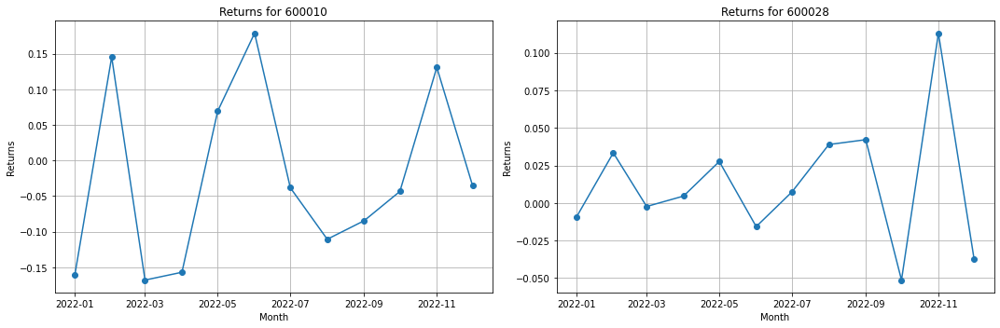

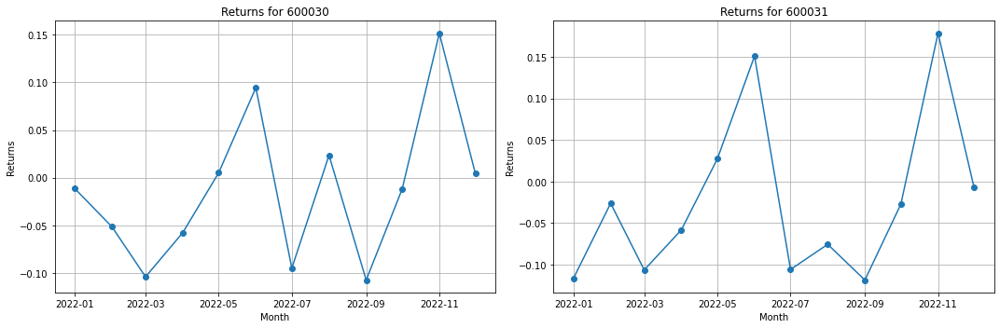

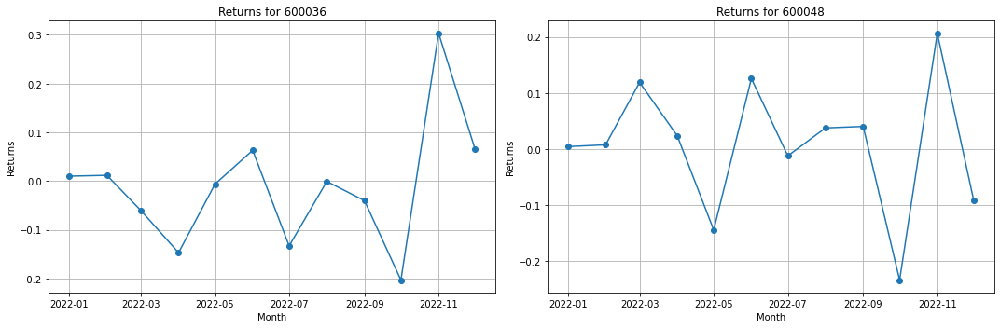

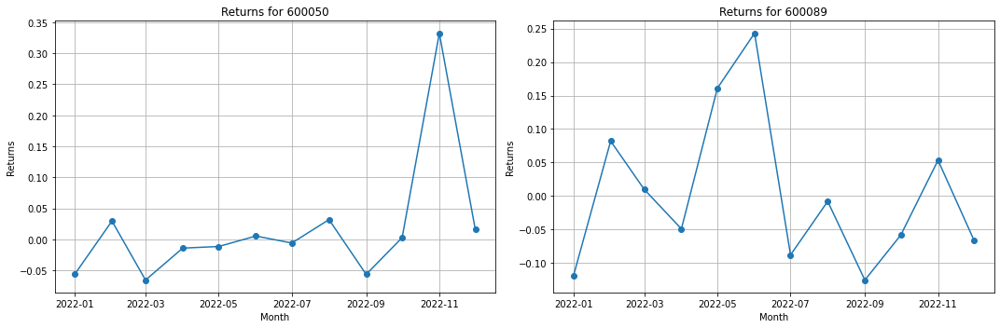

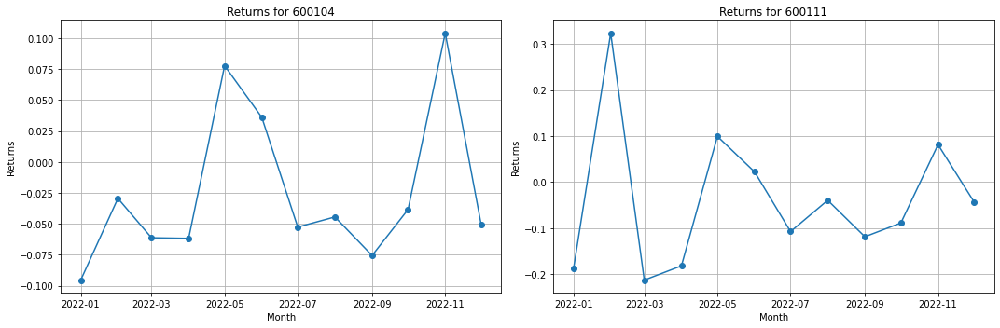

...

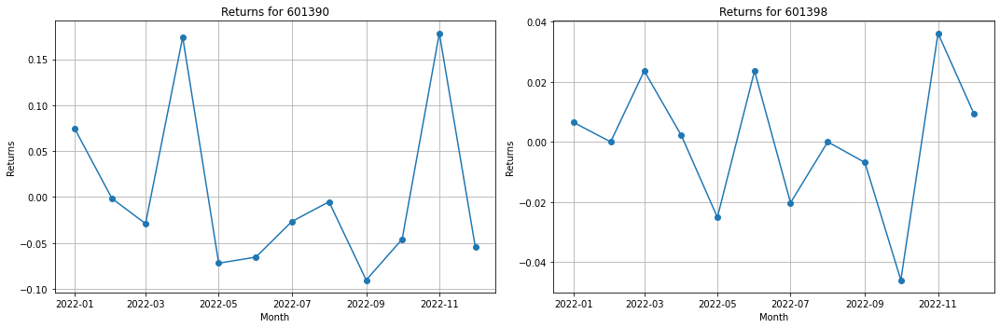

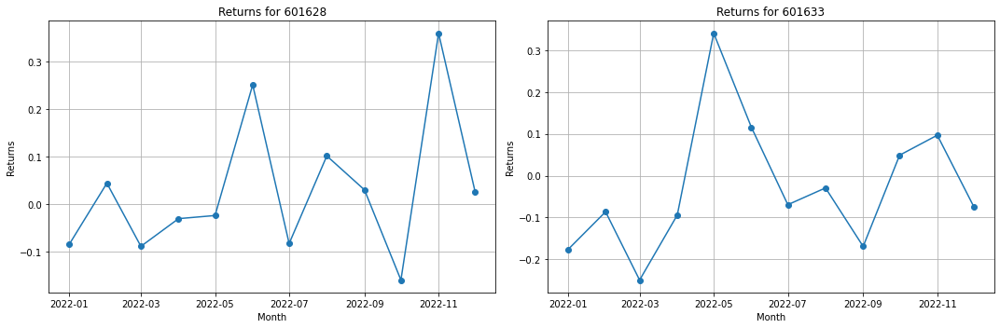

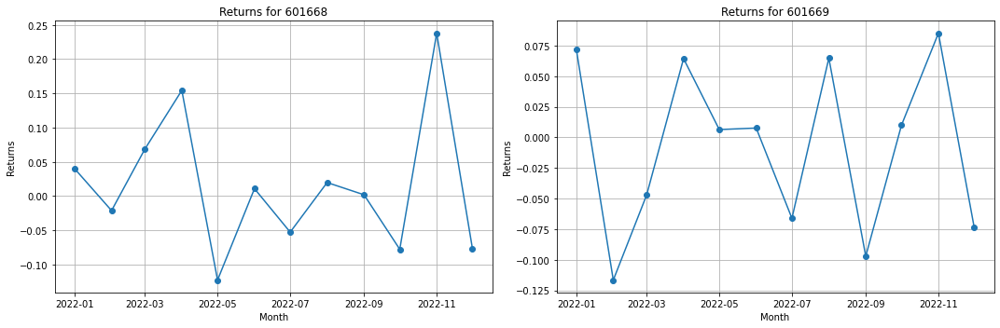

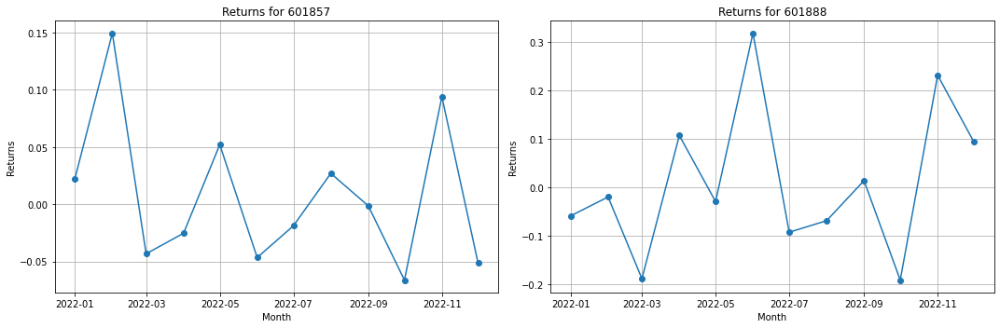

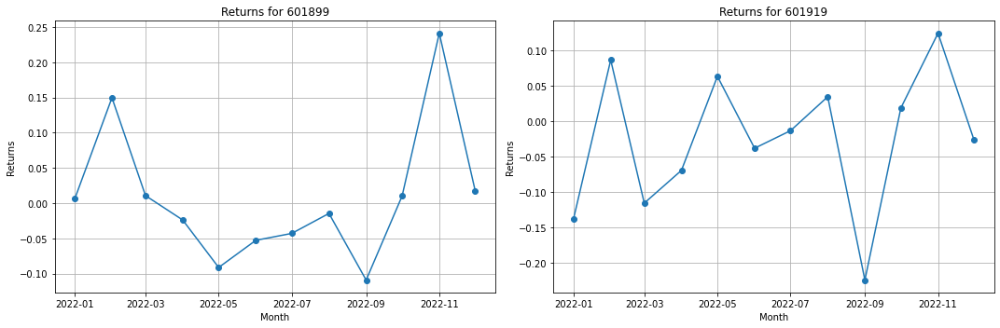

In [13]:
import matplotlib.pyplot as plt
    
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o')
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        
    plt.tight_layout()
    plt.show()

In [15]:
import numpy as np
from scipy.optimize import minimize

def maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate):
    
    def portfolio_variance(weights, cov_matrix):
        return weights.T @ cov_matrix @ weights

    def portfolio_return(weights, returns):
        return weights.T @ returns

    def sharpe_ratio(weights, returns, cov_matrix, risk_free_rate):
        p_var = portfolio_variance(weights, cov_matrix)
        p_ret = portfolio_return(weights, returns)
        return -(p_ret - risk_free_rate) /np.sqrt(p_var)

#     def check_sum(weights):
#         return np.sum(weights) - 1

    # Number of assets
    num_assets = len(mean_returns)
    
    # Constraints and bounds
    bounds = tuple((0, np.inf) for _ in range(num_assets))
    
    # Initial guess: Even distribution of weights
    initial_guess = num_assets * [1. / num_assets,]
    
    # Optimization function call
    result = minimize(sharpe_ratio, initial_guess, args=(mean_returns, cov_matrix, risk_free_rate),
                      method='SLSQP', bounds=bounds)
    
    # Check if the optimization was successful
    if result.success:
        return result.x
    else:
        raise Exception("Optimization failed: " + result.message)

In [16]:
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_mean = []
market_returns = []
mean_returns_dict = {}

for months in test_period:
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    mean_returns = historical_data.mean()
    mean_returns_dict[months] = mean_returns
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights /= sum(optimal_weights)
    
    actual_returns = data.loc[end_date].values
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
    
    predicted_returns_mean.append(predicted_returns)
    market_returns.append(equal_weighted_returns)

In [17]:
mean_returns_df = pd.DataFrame(mean_returns_dict).transpose()

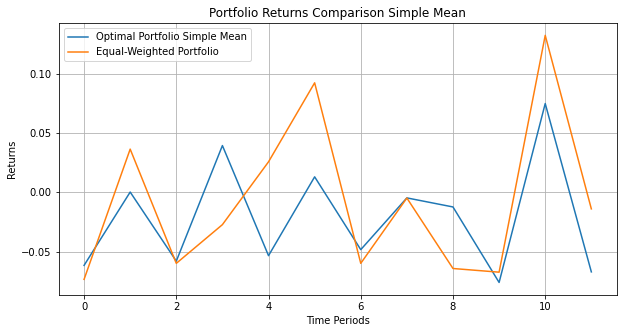

In [18]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_mean, label='Optimal Portfolio Simple Mean')
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison Simple Mean')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.grid(True)
plt.show()


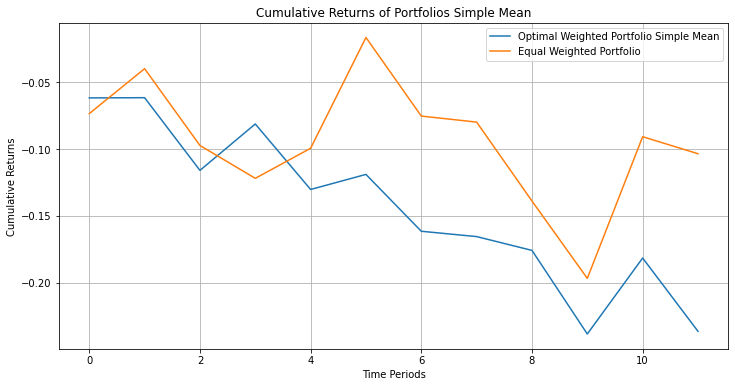

In [20]:
cumulative_returns_mean = np.cumprod(1 + np.array(predicted_returns_mean)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_mean, label='Optimal Weighted Portfolio Simple Mean')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios Simple Mean')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# Time Series Model

In [21]:
#ARIMA model
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import StandardScaler

# Load the main stock data
file_path = 'Data\SSE_data.xlsx'
data_time_series = pd.read_excel(file_path)

# Load the additional P/E and P/BV data
pe_pbv_data_path = 'Data\Monthly_PE_PBV_Data.xlsx'
pe_pbv_data = pd.read_excel(pe_pbv_data_path)

# Convert 'Trading Month' into 'Year' and 'Month' for both datasets
data_time_series[['Year', 'Month']] = data_time_series['Trading Month'].str.split('-', expand=True)
pe_pbv_data[['Year', 'Month']] = pe_pbv_data['Month'].str.split('-', expand=True)

# Merging the datasets on 'Stock Code', 'Year' and 'Month'
combined_data = pd.merge(data_time_series, pe_pbv_data, on=['Stock Code', 'Year', 'Month'], how='left')

# Handle missing P/E and P/BV values by replacing them with the median for each stock
combined_data['P/E Ratio'] = combined_data.groupby('Stock Code')['P/E Ratio'].transform(lambda x: x.fillna(x.median()))
combined_data['P/B Ratio'] = combined_data.groupby('Stock Code')['P/B Ratio'].transform(lambda x: x.fillna(x.median()))

# Replace remaining missing values with overall median
combined_data['P/E Ratio'].fillna(combined_data['P/E Ratio'].median(), inplace=True)
combined_data['P/B Ratio'].fillna(combined_data['P/B Ratio'].median(), inplace=True)

# Select relevant numeric columns for the ARIMA model
numeric_cols = ['Market Value of Tradable Shares', 'Monthly Return Without Cash Dividend Reinvested']

# Convert relevant columns to numeric, handling non-numeric entries
combined_data[numeric_cols] = combined_data[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Remove rows with missing values in the numeric columns
combined_data.dropna(subset=numeric_cols, inplace=True)

# Scale the data
scaler = StandardScaler()
combined_data[numeric_cols] = scaler.fit_transform(combined_data[numeric_cols])

# Dictionary to hold predicted results for each stock
all_predictions = {}

# Loop through each unique stock code
for stock in combined_data['Stock Code']. unique():
    stock_data = combined_data[(combined_data['Stock Code'] == stock) & (combined_data['Year'].astype(int) <= 2021)]

    if stock_data.empty or len(stock_data) < 4:  # Ensuring sufficient data for ARIMA
        continue

    # Testing for stationarity
    result = adfuller(stock_data['Monthly Return Without Cash Dividend Reinvested'])
    if result[1] > 0.05:  # p-value > 0.05 means non-stationary
        continue  # Skipping non-stationary series

    # Fit ARIMA model
    model = ARIMA(stock_data['Monthly Return Without Cash Dividend Reinvested'], order=(4, 1, 1))  # Example order
    try:
        fitted_model = model.fit()
    except Exception as e:
        print(f"Failed to fit ARIMA for stock {stock}: {e}")
        continue

    # Forecast for each month of 2022
    predicted_returns = fitted_model.forecast(steps=12)

    # Storing predictions
    all_predictions[stock] = predicted_returns

# Output all predictions
# print(all_predictions)


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jeffers

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g

In [22]:
for keys in all_predictions.keys():
    all_predictions[keys] = all_predictions[keys].to_frame().reset_index().drop("index",axis  = 1)

In [23]:
predicted_data = pd.concat(
    [df.assign(stock_code=stock) for stock, df in all_predictions.items()]
)

predicted_data = predicted_data.pivot( columns='stock_code', values='predicted_mean')
predicted_data.head()

stock_code,600010,600028,600030,600031,600036,600048,600050,600089,600104,600111,...,601390,601398,601628,601633,601668,601669,601857,601888,601899,601919
0,-0.122015,-0.064762,0.064771,-0.087177,0.142497,0.036006,-0.167602,0.010208,-0.034042,1.363507,...,0.020841,-0.066567,-0.058446,0.003828,-0.100704,0.853552,0.078218,0.105264,0.079812,-0.305950
1,0.053940,-0.206518,-0.141555,-0.069795,0.140163,-0.119263,-0.099869,0.347807,-0.061918,1.211928,...,-0.185679,-0.103698,-0.085295,-0.014186,-0.110836,0.259435,-0.552093,0.029367,0.102531,-0.128125
2,-0.047028,-0.149236,-0.064896,0.014888,-0.064052,0.056078,-0.201246,-0.066861,-0.059842,0.827036,...,0.022985,-0.085052,-0.064222,-0.151004,-0.007968,-0.497959,-0.215220,0.361748,0.060659,0.125250
3,-0.019300,-0.060092,0.066019,-0.001001,-0.014742,0.063447,-0.088180,-0.056134,-0.044303,1.142270,...,0.145239,-0.080349,-0.075135,-0.004646,0.064260,0.409955,0.006785,0.131274,0.067498,0.221328
4,-0.008970,-0.118451,-0.013844,-0.003751,0.046768,-0.011609,-0.133845,0.075158,-0.056042,0.744002,...,0.060844,-0.085234,-0.076951,0.082788,-0.059015,0.216673,-0.207885,0.151188,0.077103,-0.001644


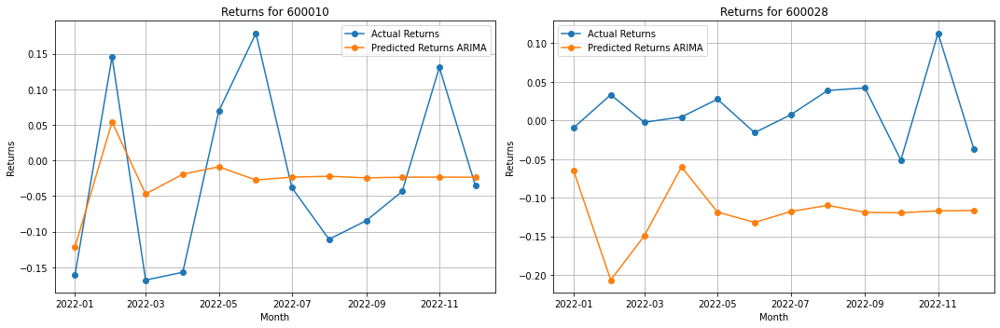

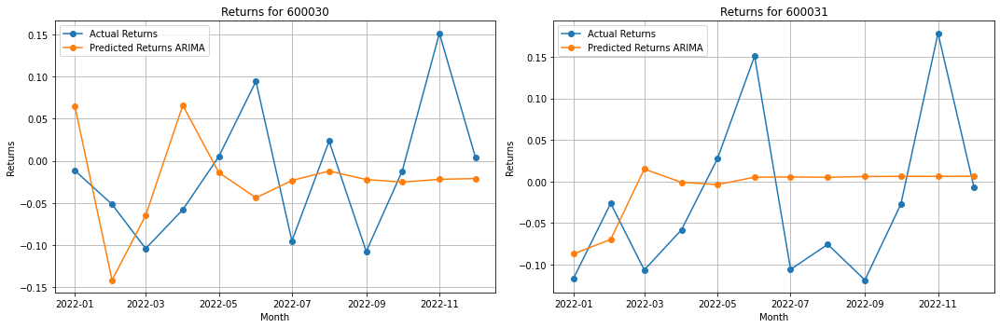

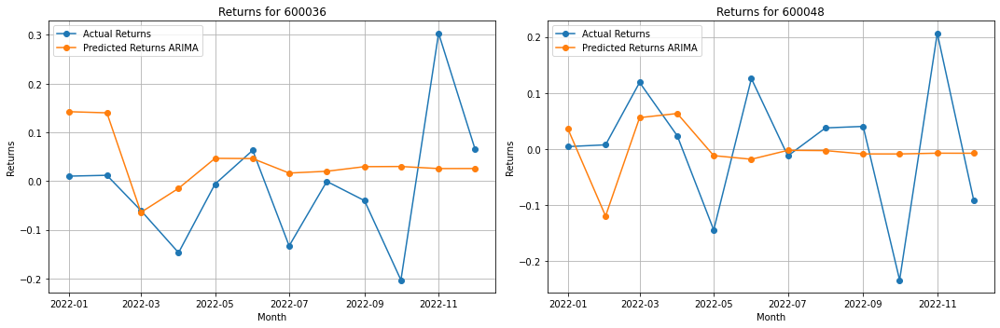

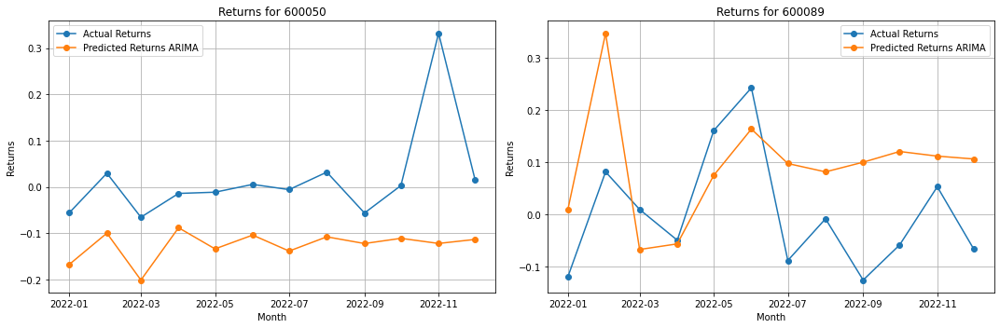

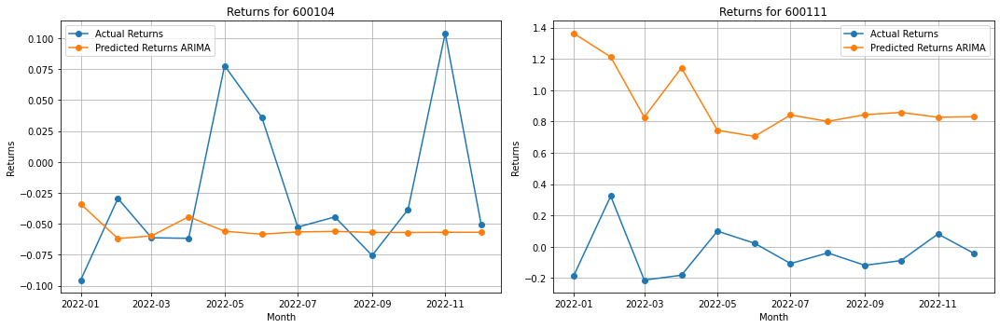

...

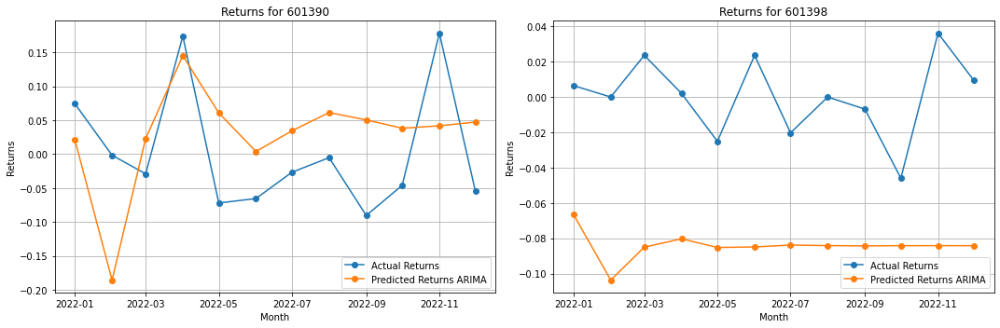

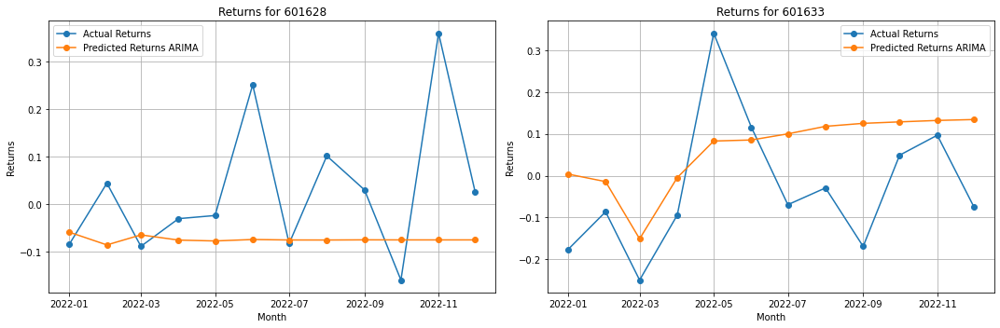

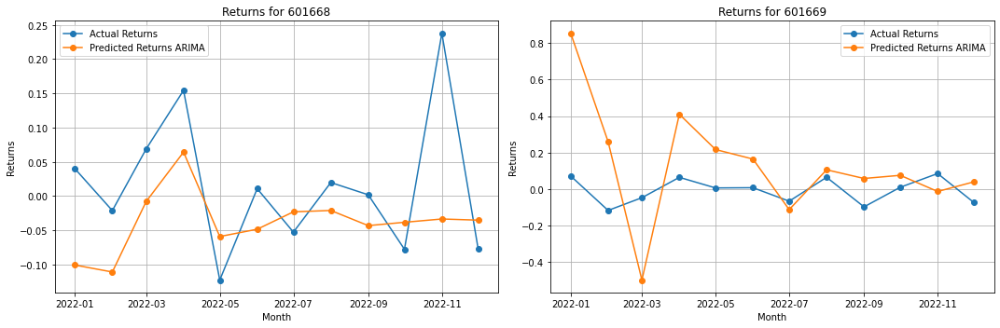

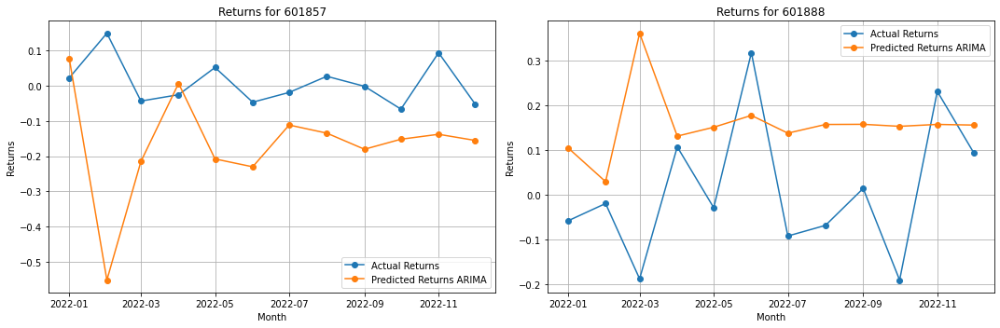

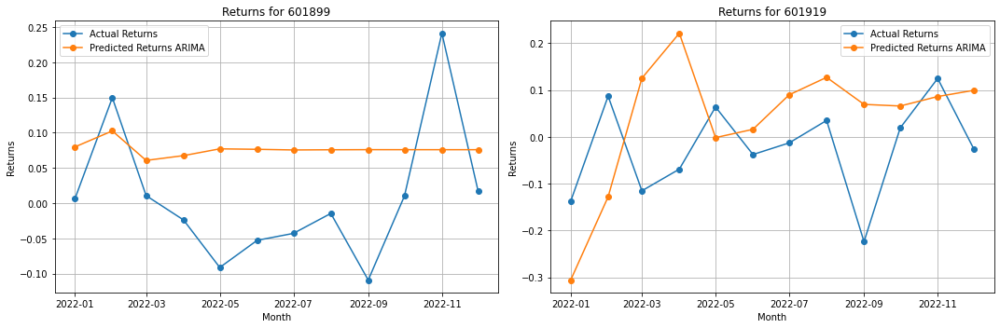

In [24]:
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o', label='Actual Returns')
        ax.plot(testing_period.index, predicted_data[stock], marker='o', label='Predicted Returns ARIMA')
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        ax.legend()
        
    plt.tight_layout()
    plt.show()

In [25]:
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_arima = []
market_returns = []
iterations = 0


for months in test_period:
    
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    mean_returns = predicted_data.loc[iterations].values #historical_data.mean() 
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights/= sum(optimal_weights)

    
    actual_returns = data.loc[end_date].values
    mean_returns_god = np.array(actual_returns)
    
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
    
    predicted_returns_arima.append(predicted_returns)
    market_returns.append(equal_weighted_returns)
    
    iterations += 1

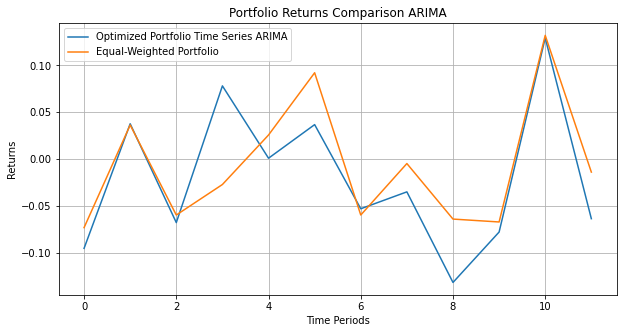

In [81]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_arima, label = "Optimized Portfolio Time Series ARIMA")
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison ARIMA')

# Add a legend to the plot
ax.legend()
plt.grid(True)

# Show the plot
plt.show()


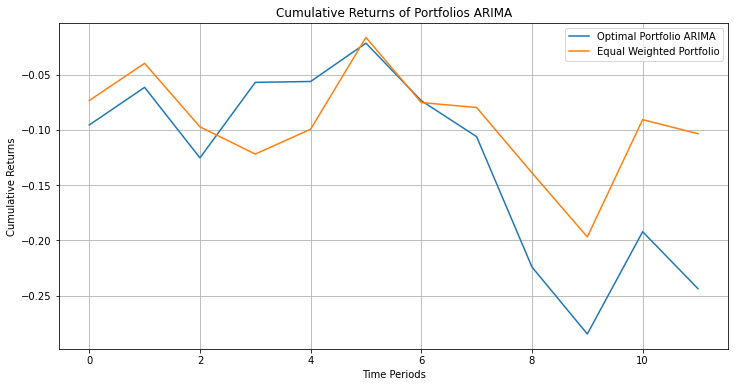

In [27]:
cumulative_returns_ARIMA = np.cumprod(1 + np.array(predicted_returns_arima)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_ARIMA, label='Optimal Portfolio ARIMA')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios ARIMA')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# Time Series SARIMAX

In [28]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

# Load the main stock data
time_series_data = pd.read_excel('Data\SSE_data.xlsx')

# Load the additional P/E and P/BV data
pe_pbv_data = pd.read_excel('Data\Monthly_PE_PBV_Data.xlsx')

# Convert 'Trading Month' into 'Year' and 'Month' for both datasets
time_series_data[['Year', 'Month']] = time_series_data['Trading Month'].str.split('-', expand=True)
pe_pbv_data[['Year', 'Month']] = pe_pbv_data['Month'].str.split('-', expand=True)

# Merging the datasets on 'Stock Code', 'Year' and 'Month'
combined_data = pd.merge(time_series_data, pe_pbv_data, on=['Stock Code', 'Year', 'Month'], how='left')

# Handle missing P/E and P/BV values
combined_data['P/E Ratio'] = combined_data.groupby('Stock Code')['P/E Ratio'].transform(lambda x: x.fillna(x.median()))
combined_data['P/B Ratio'] = combined_data.groupby('Stock Code')['P/B Ratio'].transform(lambda x: x.fillna(x.median()))
combined_data.fillna(combined_data.median(), inplace=True)

# Select relevant numeric columns for the SARIMAX model
numeric_cols = ['Market Value of Tradable Shares', 'Monthly Return Without Cash Dividend Reinvested']

# Convert relevant columns to numeric, handling non-numeric entries
combined_data[numeric_cols] = combined_data[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Scale the data
scaler = StandardScaler()
combined_data[numeric_cols] = scaler.fit_transform(combined_data[numeric_cols])

# Dictionary to hold predicted results and actuals for MSE calculation
all_predictions = {}
mse_values = []

# Loop through each unique stock code
for stock in combined_data['Stock Code'].unique():
    stock_data = combined_data[(combined_data['Stock Code'] == stock) & (combined_data['Year'].astype(int) <= 2021)]
    if stock_data.empty or len(stock_data) < 12:
        continue
    
    endog = stock_data['Monthly Return Without Cash Dividend Reinvested']
    exog = stock_data[['P/E Ratio', 'P/B Ratio']]

    # Use auto_arima to determine the best model parameters including seasonal_order
    seasonal_model = auto_arima(endog, exogenous=exog, seasonal=True, m=12, trace=True,
                                error_action='ignore', suppress_warnings=True, stepwise=True,
                                information_criterion='aic')

    # Fit SARIMAX Model with the best found parameters
    model = SARIMAX(endog, exog=exog, order=seasonal_model.order,
                    seasonal_order=seasonal_model.seasonal_order)
    try:
        fitted_model = model.fit(disp=False)
        # Forecast
        exog_future = exog[-12:]  # Future exogenous variables
        predicted_returns = fitted_model.get_forecast(steps=12, exog=exog_future)
        predicted_mean = predicted_returns.predicted_mean
        all_predictions[stock] = predicted_mean

        # Calculate MSE
        actual_data = time_series_data[(time_series_data['Stock Code'] == stock) & (time_series_data['Year'] == '2022')]['Monthly Return Without Cash Dividend Reinvested']
        if len(actual_data) == 12:
            mse = mean_squared_error(actual_data, predicted_mean)
            mse_values.append(mse)
    except Exception as e:
        print(f"Failed to fit SARIMAX for stock {stock}: {e}")

average_mse = np.mean(mse_values) if mse_values else float('nan')
print("Average Mean Squared Error across all stocks:", average_mse)



C:\Users\JEFFER~1\AppData\Local\Temp/ipykernel_7976/4160434634.py:24: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  combined_data.fillna(combined_data.median(), inplace=True)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=455.431, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=455.592, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=455.179, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.480, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=457.315, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=457.313, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=453.601, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=453.189, Time=0.02 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=455.178, Time=0.05 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=450.679, Time=0.06 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=452.679, Time=0.15 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=45

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=463.230, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=461.473, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=465.075, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=465.053, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=459.523, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=463.090, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=463.073, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=465.070, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=463.469, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=463.468, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=464.975, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.394 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=427.534, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=419.876, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=422.421, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=422.447, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=417.891, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=421.863, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=421.860, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=422.658, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.461, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=420.490, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=421.940, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.211 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=316.234, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=309.975, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=313.289, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=313.228, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=307.992, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=311.504, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=311.530, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=313.483, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=311.618, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=311.493, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=312.617, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.089 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=395.296, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=389.291, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=392.501, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=392.413, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=387.300, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=390.950, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=390.934, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=392.925, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=390.936, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=390.891, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.540 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=372.873, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=367.909, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=371.297, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=371.477, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=368.117, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=369.482, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=369.616, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=369.413, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=369.800, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=369.812, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.555, Time=0.09 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.003 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=400.237, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=402.854, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=402.738, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=398.597, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=402.206, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=402.204, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=400.881, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=400.757, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=402.712, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.613 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=323.440, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=329.875, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=329.936, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=328.278, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=328.677, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=321.524, Time=0.71 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=322.992, Time=0.36 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=323.401, Time=1.32 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=321.962, Time=0.66 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=325.409, Time=1.49 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=331.075, Time=0.54 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=330.991, Time=0.39 sec
 ARIMA(3,0,2)(0,0,1)[12] intercept   : AIC=322.876, Time=0.75 sec
 ARIMA(2,0,3)(0,0,1)[12] intercept   : AIC=322.955, Time=0.46 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=330.335, Time=0.08 sec
 ARIMA(1,0

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_ind

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=535.237, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=531.721, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=532.162, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=530.347, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=530.423, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=532.463, Time=0.02 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=531.576, Time=0.10 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=531.265, Time=0.15 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=531.748, Time=0.06 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=533.254, Time=0.29 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=530.354, Time=0.06 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=530.754, Time=0.14 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=530.604, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=530.759, Time=0.07 sec
 ARIMA(1,0,2)(0,0,1)[12] intercep

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=442.133, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=445.567, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.493, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.220, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=444.113, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=444.111, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=445.857, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.585, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.511, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=444.808, Time=0.09 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.384 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=329.819, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=332.803, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=332.815, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=328.406, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=331.762, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=331.750, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=330.935, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=330.976, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=332.582, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.703 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=375.700, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=376.528, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=376.577, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.371, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=377.682, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=377.681, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=374.712, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=374.740, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=376.687, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.517 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=394.538, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=393.639, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=387.852, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=388.115, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=392.399, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=393.317, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=389.720, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=389.776, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=388.182, Time=0.06 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=388.766, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=389.803, Time=0.07 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=389.766, Time=0.16 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=387.775, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=393.273, Time=0.02 sec
 ARIMA(0,0,1)(

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=411.294, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=414.778, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=414.781, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=413.423, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=412.860, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=412.872, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=414.860, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=413.192, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=413.177, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.679 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_ind

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=477.622, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=480.335, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=480.335, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=476.658, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=479.525, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=479.522, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=478.420, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=478.425, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=480.420, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.725 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=340.253, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=332.961, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=333.542, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=333.675, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=332.987, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=331.686, Time=0.05 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=333.674, Time=0.13 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=333.681, Time=0.13 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=331.807, Time=0.05 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=335.559, Time=0.36 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=333.558, Time=0.06 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=335.209, Time=0.19 sec
 ARIMA(0,0,0)(1,0,0)[12]             : AIC=332.534, Time=0.03 sec

Best model:  ARIMA(0,0,0)(1,0,0)[12] intercept
Total fit time: 1.779 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=365.247, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.316, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=368.444, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=363.442, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=366.988, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=366.933, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=366.469, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=366.667, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=362.403, Time=0.07 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=364.402, Time=0.17 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=364.402, Time=0.16 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=36

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimiz

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=497.080, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=499.773, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=499.582, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=496.946, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=498.923, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=498.924, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=500.876, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=498.023, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=497.876, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.431 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=542.052, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=497.488, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=540.054, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=496.059, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=497.407, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=499.357, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=485.736, Time=0.03 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=487.145, Time=0.10 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=487.046, Time=0.07 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=488.960, Time=0.18 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=472.305, Time=0.05 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=473.344, Time=0.20 sec
 ARIMA(3,1,0)(0,0,1)[12] intercept   : AI

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=337.993, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=340.211, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=338.793, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=336.836, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=338.255, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=336.895, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=339.980, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=339.977, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.830 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=434.994, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=431.486, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=435.394, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=435.363, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=429.716, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=433.477, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=433.476, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=433.404, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=433.373, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=430.009, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.823 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_ind

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=196.612, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=199.702, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=199.738, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=194.977, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=198.501, Time=0.13 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=198.452, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=197.844, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=197.933, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=199.740, Time=0.10 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.666 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=415.686, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=418.511, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=418.634, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=418.593, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=417.601, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=417.547, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.511, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=416.638, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=418.381, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.466 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=300.156, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=293.339, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=295.787, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=295.474, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=293.492, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=294.938, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=294.844, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=296.638, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=294.374, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=294.252, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=296.189, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.392 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=331.814, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=331.897, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=335.306, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=335.241, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.464, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=333.337, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=333.299, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=335.290, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=333.896, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=333.896, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=332.345, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.491 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=163.734, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=167.245, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=167.061, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=165.737, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=165.247, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=165.061, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.708, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=165.699, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=167.519, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.635 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=348.161, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=338.309, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=340.617, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=340.589, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=336.649, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=339.769, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=339.818, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=341.532, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=339.050, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=338.978, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=340.896, Time=0.10 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 0.878 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=437.736, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=435.085, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=433.378, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=432.766, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=433.456, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=431.165, Time=0.02 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=432.759, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=434.755, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=432.773, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=432.873, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=431.834, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=433.722, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=429.429, Time=0.01 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=431.006, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[12]             : AIC=431.012, Time=0.04 sec
 ARIMA(0,0

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=177.527, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=181.367, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=181.322, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=180.676, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=179.418, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=179.375, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=181.111, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=179.453, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=179.433, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=181.197, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.444 seconds


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_ind

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=379.003, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=373.435, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=372.172, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=371.681, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=372.441, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=369.805, Time=0.02 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=371.665, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=373.421, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=371.573, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=371.647, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=370.284, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=373.554, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=368.555, Time=0.02 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=370.435, Time=0.03 sec
 ARIMA(0,0,1)(0,0,1)[12]         

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.300, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=408.060, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=408.246, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=406.057, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=408.096, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=408.077, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=406.222, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=406.433, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=407.173, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.360 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=397.345, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=401.206, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=401.202, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=395.531, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=399.334, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=399.335, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=401.307, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=399.209, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=399.205, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=401.085, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.288 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=428.860, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=421.486, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=424.923, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=425.019, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=419.496, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=423.479, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=423.479, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=425.479, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=422.950, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=423.042, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=423.858, Time=0.05 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 0.686 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=240.230, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.992, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=245.141, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=245.105, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=250.814, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=238.322, Time=0.32 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=236.677, Time=0.12 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=238.282, Time=0.29 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=239.981, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=238.010, Time=0.06 sec
 ARIMA(3,0,2)(0,0,0)[12] intercept   : AIC=235.973, Time=0.14 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=237.698, Time=0.33 sec
 ARIMA(3,0,2)(0,0,1)[12] intercept   : AIC=237.726, Time=0.47 sec
 ARIMA(3,0,2)(1,0,1)[12] intercept   : AIC=239.654, Time=0.41 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept   : AIC=234.842, Time=0.09 sec
 ARIMA(3,0

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=443.720, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=433.646, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=437.308, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=437.294, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=433.690, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=435.311, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=435.297, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=437.286, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=435.646, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=435.646, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=437.280, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.386 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=403.624, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=407.490, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=407.479, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=401.761, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=405.571, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=405.568, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=407.518, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=405.527, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=405.516, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=407.248, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.329 seconds
Performing stepwise search to minimize aic


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=493.230, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=491.897, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=493.633, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=493.570, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=489.901, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=493.581, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=493.605, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=491.831, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=491.780, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=493.780, Time=0.04 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.311 seconds
Average Mean Squared Error across all stocks: 0.11789747644565285


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result i

In [29]:
for keys in all_predictions.keys():
    all_predictions[keys] = all_predictions[keys].to_frame().reset_index().drop("index",axis  = 1)

In [30]:
predicted_data = pd.concat(
    [df.assign(stock_code=stock) for stock, df in all_predictions.items()]
)

predicted_data = predicted_data.pivot( columns='stock_code', values='predicted_mean')
predicted_data.head()

stock_code,600010,600028,600030,600031,600036,600048,600050,600089,600104,600111,...,601390,601398,601628,601633,601668,601669,601857,601888,601899,601919
0,-0.112914,-0.005680,0.140997,0.130279,0.090472,-0.002636,-0.025638,0.169683,0.178637,0.960651,...,0.143904,-0.069334,-0.012090,0.693170,-0.054158,0.070681,0.053685,0.466241,0.087990,0.120601
1,0.032531,-0.006485,0.135526,0.132372,0.090472,-0.002967,-0.026495,0.161432,-0.063973,0.717230,...,-0.005653,-0.073149,-0.028807,0.518720,-0.056859,0.072364,-0.437310,0.488301,0.111729,0.122836
2,-0.001305,-0.006226,0.118815,0.109961,0.090472,-0.002717,-0.026128,0.148922,-0.169698,-0.106583,...,-0.005851,-0.075464,-0.027643,0.498216,-0.058436,0.077039,-0.048684,0.485398,0.088173,0.131388
3,0.006371,-0.006154,0.118616,0.099432,0.093305,-0.002673,-0.026005,0.164094,-0.185273,0.245325,...,-0.005336,-0.069879,-0.028729,0.552747,-0.055599,0.071429,0.055744,0.494771,0.101097,0.177646
4,0.005057,-0.006356,0.129856,0.097532,0.103025,-0.002581,-0.026617,0.158770,0.010885,0.294091,...,-0.005336,-0.070969,-0.031622,0.613197,-0.055036,0.072925,-0.145858,0.530468,0.103264,0.207674


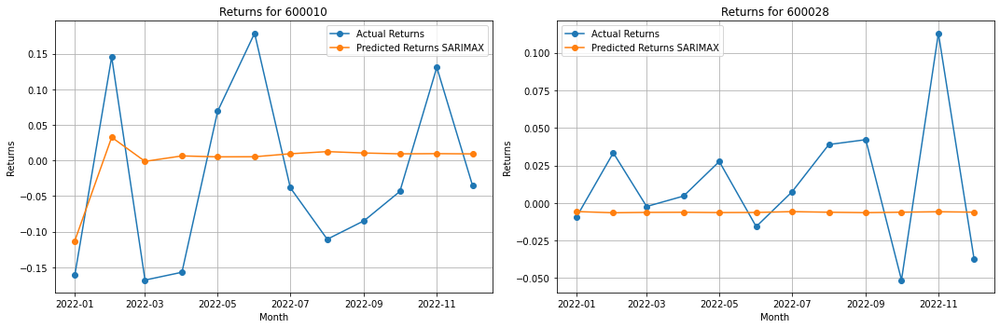

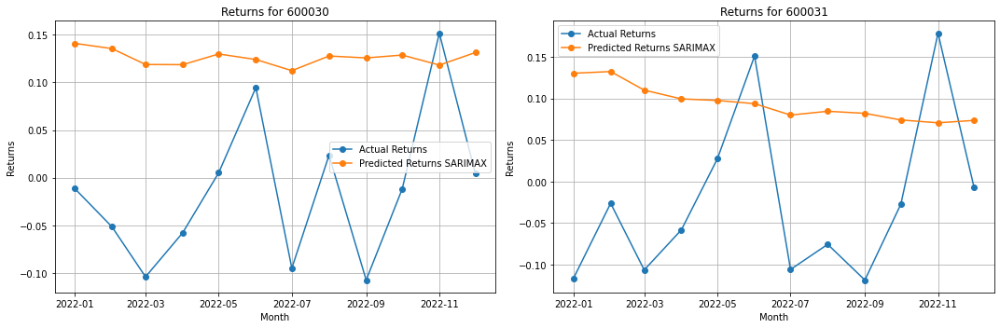

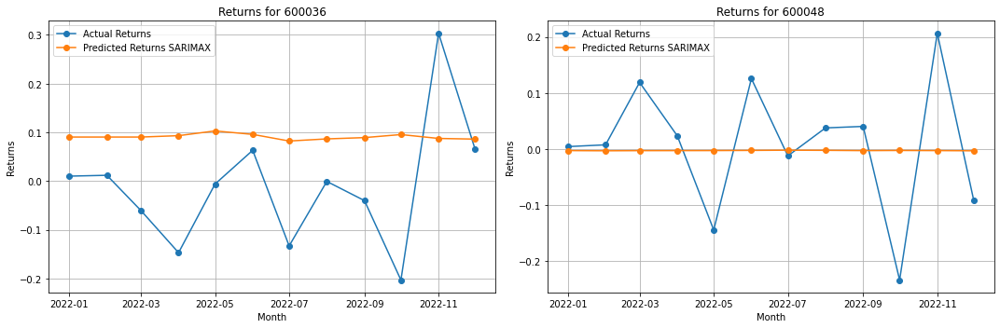

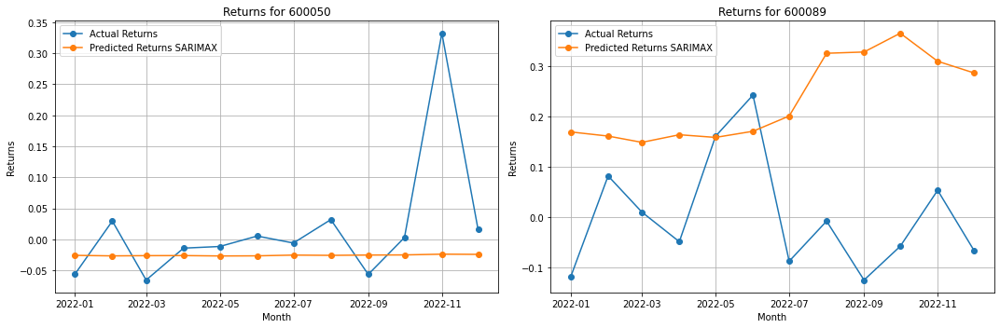

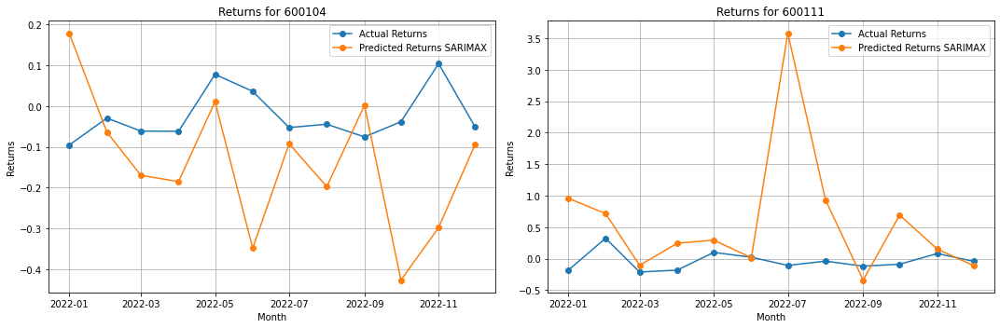

...

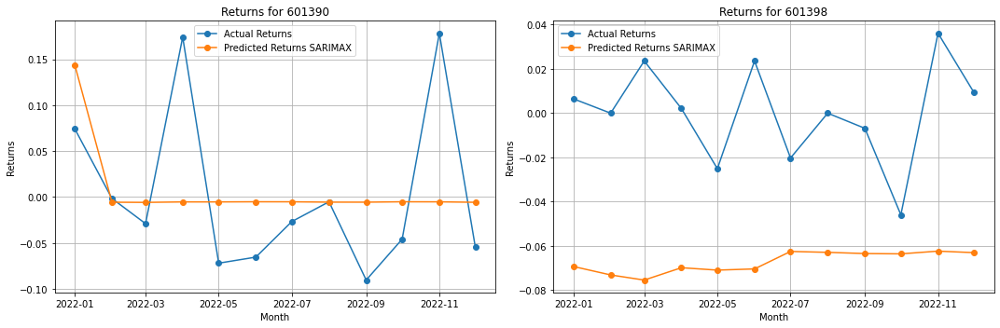

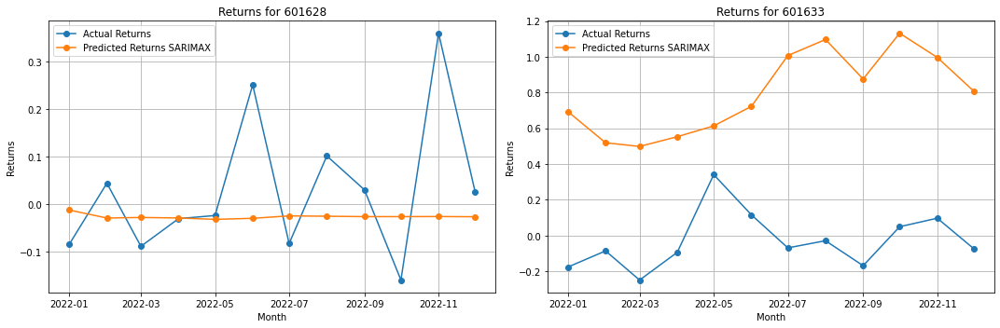

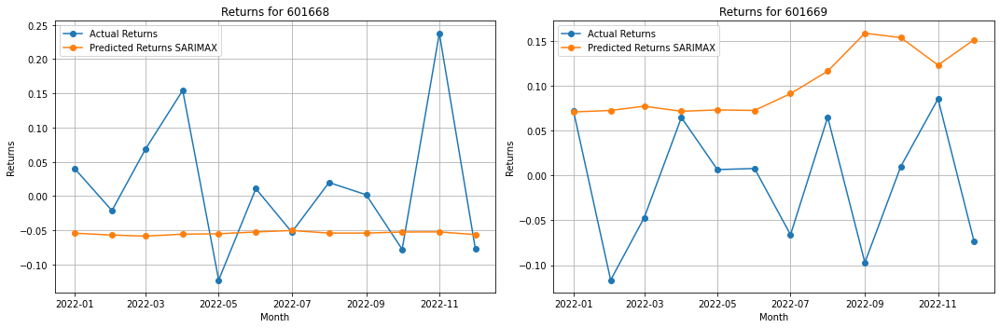

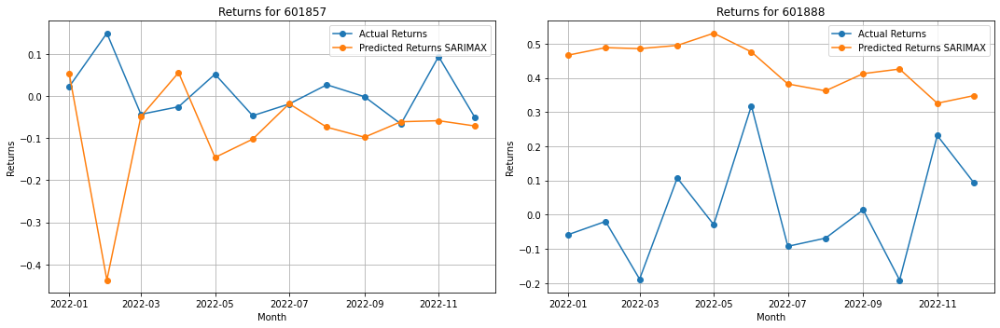

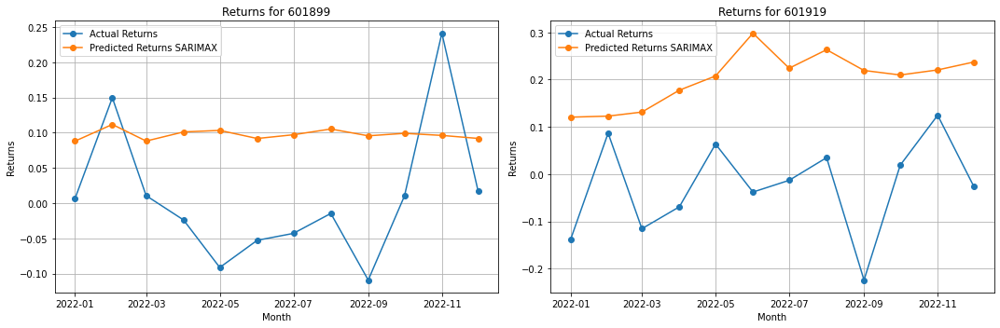

In [31]:
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o', label='Actual Returns')
        ax.plot(testing_period.index, predicted_data[stock], marker='o', label='Predicted Returns SARIMAX')
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        ax.legend()
        
    plt.tight_layout()
    plt.show()

In [32]:
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_SARIMAX = []
market_returns = []
iterations = 0


for months in test_period:
    
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    mean_returns = predicted_data.loc[iterations].values #historical_data.mean() 
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights/= sum(optimal_weights)
    
    actual_returns = data.loc[end_date].values
    mean_returns_god = np.array(actual_returns)
    
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
    
    predicted_returns_SARIMAX.append(predicted_returns)
    market_returns.append(equal_weighted_returns)
    
    iterations += 1

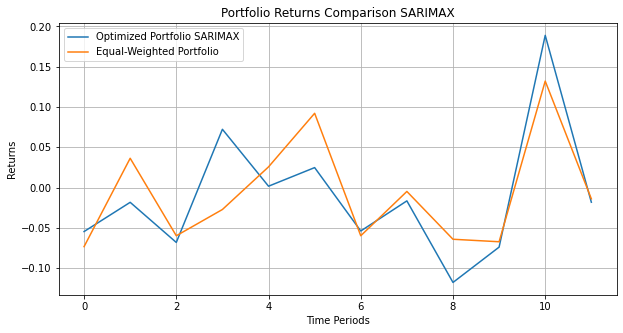

In [82]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_SARIMAX, label = "Optimized Portfolio SARIMAX")
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison SARIMAX')
plt.grid(True)

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()


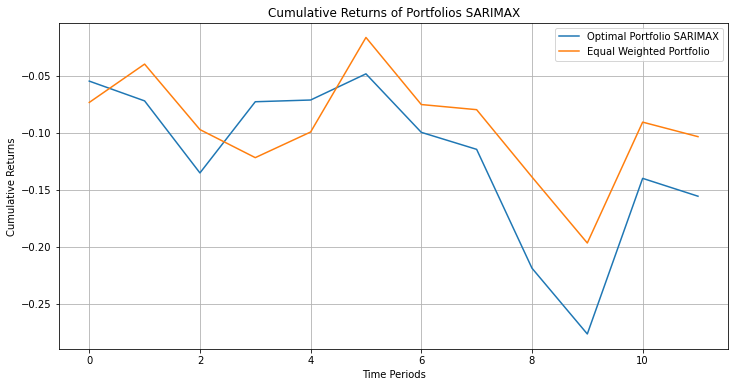

In [34]:
cumulative_returns_SARIMAX = np.cumprod(1 + np.array(predicted_returns_SARIMAX)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_SARIMAX, label='Optimal Portfolio SARIMAX')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios SARIMAX')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# LSTM

In [35]:
import pandas as pd

# Load data from the first Excel file (SSE_data.xlsx)
sse_data = pd.read_excel("Data\SSE_data.xlsx")

# Load data from the second Excel file (Monthly_PE_PBV_Data.xlsx)
monthly_pe_pbv_data = pd.read_excel("Data\Monthly_PE_PBV_Data.xlsx")

# Merge the two datasets on 'Stock Code' and 'Trading Month'
merged_data = pd.merge(sse_data, monthly_pe_pbv_data, how='inner', left_on=['Stock Code', 'Trading Month'], right_on=['Stock Code', 'Month'])

# Drop unnecessary columns
merged_data.drop(columns=['Month'], inplace=True)

# Check for missing values and data types
merged_data_info = merged_data.info()
merged_data_missing_values = merged_data.isnull().sum()


# Impute missing values using the median for the specified columns
columns_to_impute = ['Monthly Return With Cash Dividend Reinvested',
                     'Monthly Return Without Cash Dividend Reinvested',
                     'P/E Ratio']

for column in columns_to_impute:
    median_value = merged_data[column].median()
    merged_data[column].fillna(median_value, inplace=True)

# Verify if all missing values have been handled
missing_values_after_imputation = merged_data.isnull().sum()


from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Prepare the data with the necessary shifts and filtering
merged_data['Future Return'] = merged_data['Monthly Return Without Cash Dividend Reinvested'].shift(-1)
#merged_data.dropna(subset=['Future Return'], inplace=True)  # Remove rows with NaN in target variable

# Define the feature matrix and target vector
features = merged_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
target = merged_data['Future Return']

# Split the data (keeping data from 2010 to 2021 for training and 2022 for testing)
training_data = merged_data[merged_data['Trading Month'] < '2022-01']
testing_data = merged_data[merged_data['Trading Month'] >= '2022-01']

X_train = training_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_train = training_data['Future Return']
X_test = testing_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_test = testing_data['Monthly Return Without Cash Dividend Reinvested']


import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Prepare the data for LSTM - scale the features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_features = scaler.fit_transform(features)

# Reshape data for LSTM: [samples, time steps, features]
X_train_scaled = np.array(X_train)
X_test_scaled = np.array(X_test)
X_train_scaled = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Build LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2])))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(1))

# Compile the model
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
lstm_model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=1)

# Predict using the LSTM model
lstm_predictions = lstm_model.predict(X_test_scaled)
lstm_mse = mean_squared_error(y_test, lstm_predictions)
lstm_r2 = r2_score(y_test, lstm_predictions.flatten())

print(lstm_mse, lstm_r2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5789 entries, 0 to 5788
Data columns (total 13 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Stock Code                                       5789 non-null   int64  
 1   Trading Month                                    5789 non-null   object 
 2   Monthly Opening Price                            5789 non-null   float64
 3   Monthly Closing Price                            5789 non-null   float64
 4   Number of Shares Traded in Month                 5789 non-null   int64  
 5   Value of Shares Traded in Month                  5789 non-null   int64  
 6   Market Value of Tradable Shares                  5789 non-null   float64
 7   Total Market Value                               5789 non-null   float64
 8   Number Of Days Of Monthly Trading                5789 non-null   int64  
 9   Monthly Return With Cash Divid

In [83]:
lstm_correct = []
for i in lstm_predictions:
    lstm_correct.append(i[0])

In [84]:
results_df = pd.DataFrame({
    'Actual Returns': y_test,
    'Predicted Returns': lstm_correct #rf_predictions #svm_predictions
}, index=testing_data.index)


#results_df

# Include 'Stock Code' and 'Trading Month' in the results DataFrame
results_df['Stock Code'] = testing_data['Stock Code']
results_df['Trading Month'] = testing_data['Trading Month']

predicted_data = results_df.pivot(index= "Trading Month",columns='Stock Code', values='Predicted Returns')

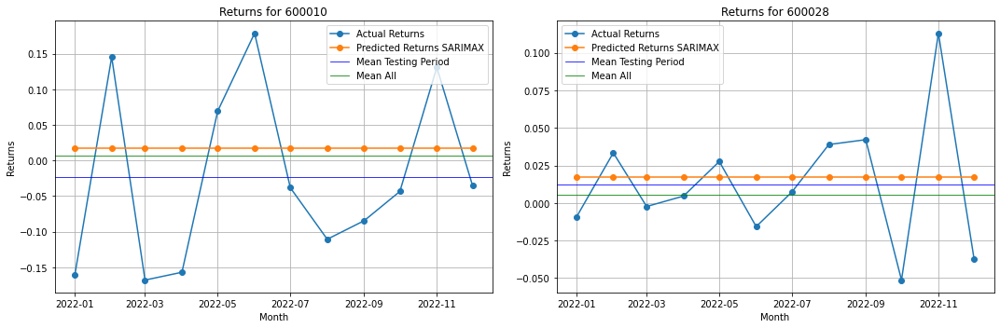

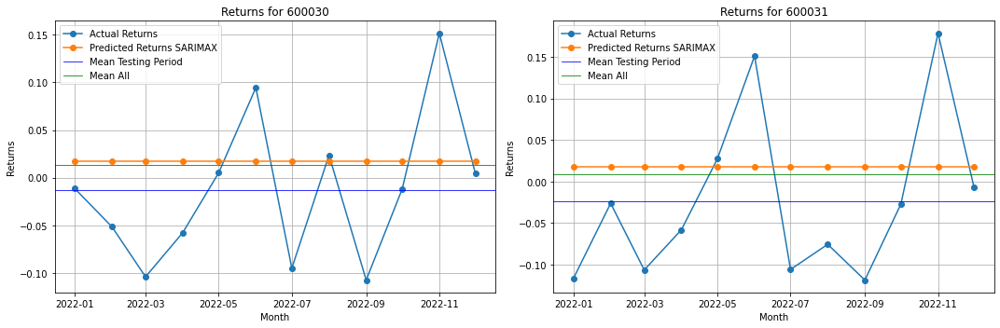

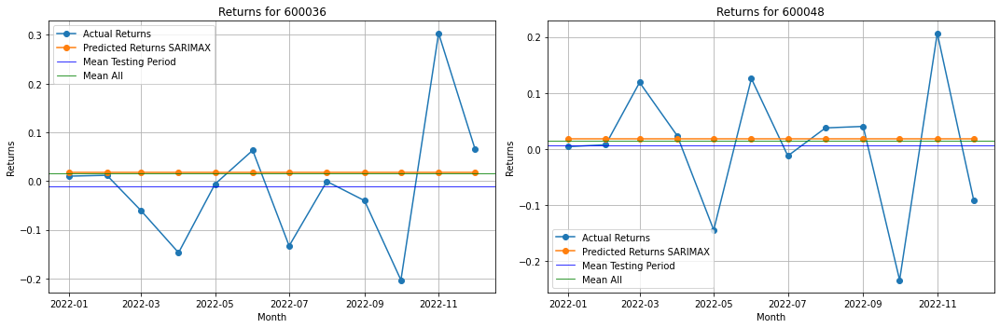

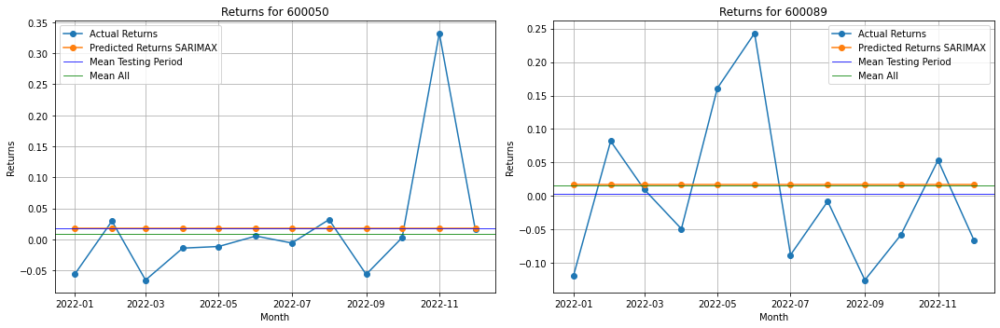

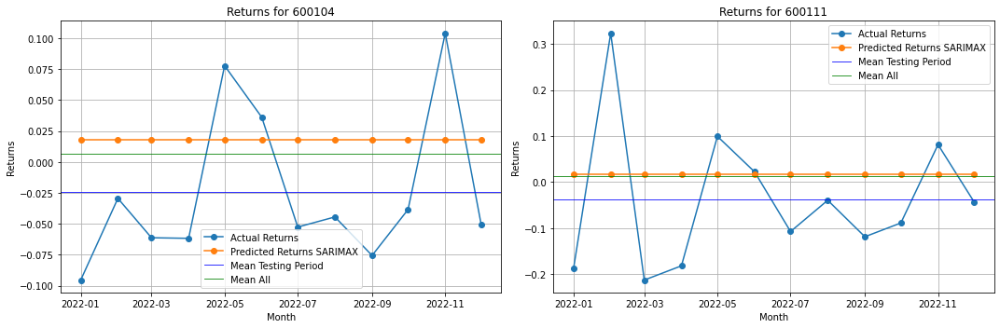

...

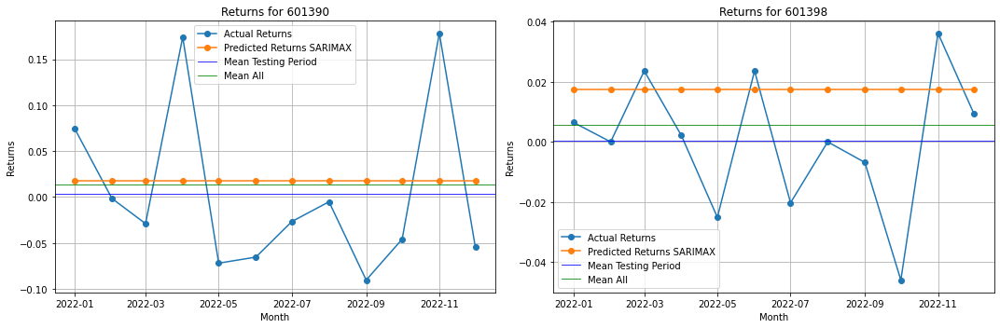

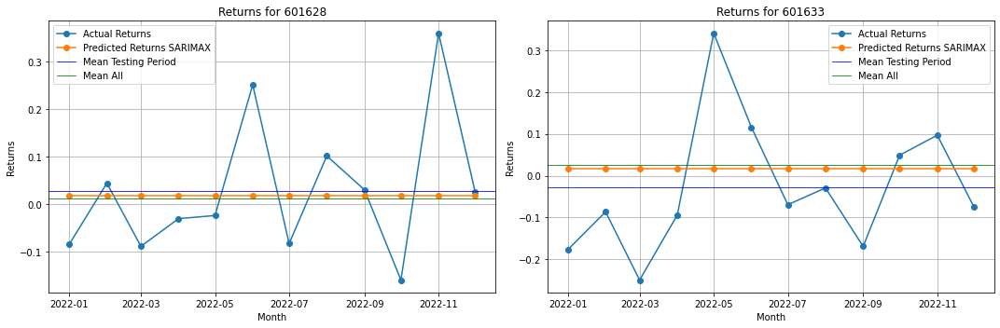

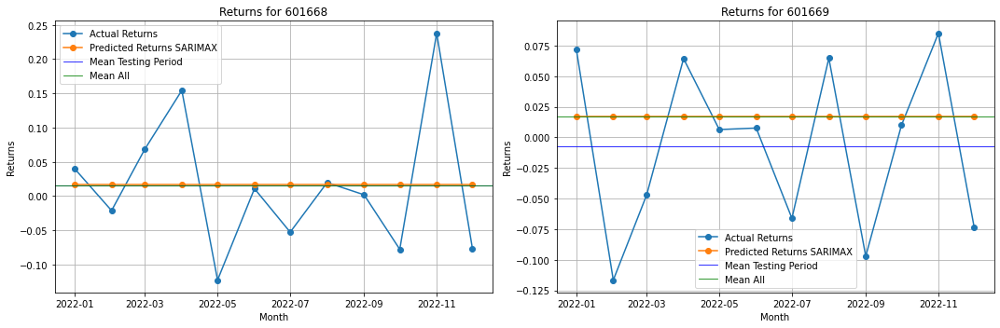

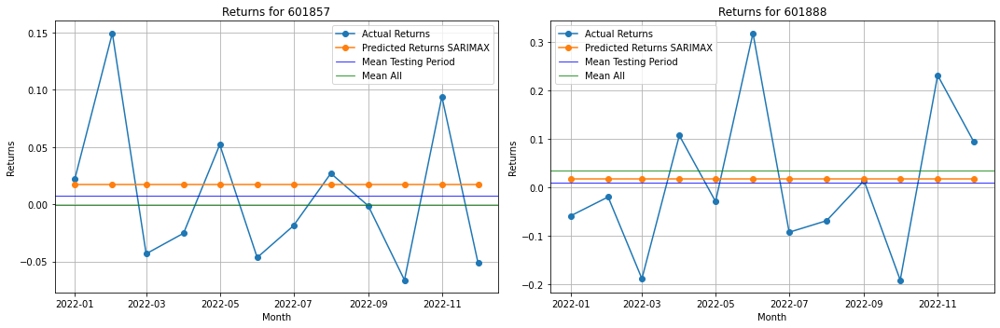

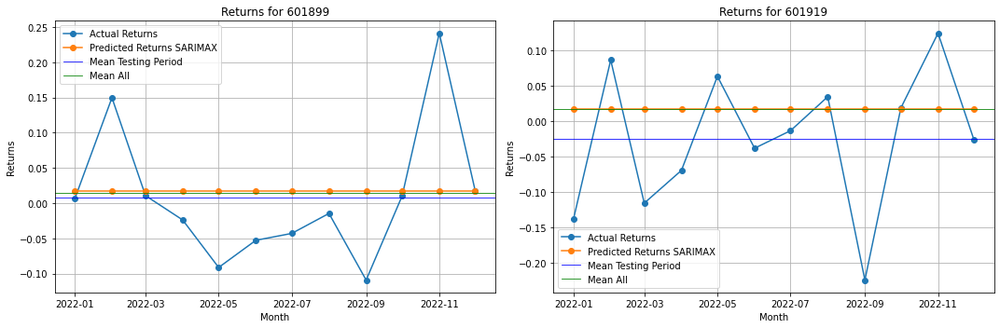

In [38]:
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o', label='Actual Returns')
        ax.plot(testing_period.index, predicted_data[stock], marker='o', label='Predicted Returns SARIMAX')
        
        mean_actual = testing_period[stock].mean()
        ax.axhline(y=mean_actual, color='blue', linestyle='-', linewidth=0.8, label='Mean Testing Period')
        mean_all = data[stock].mean()
        ax.axhline(y=mean_all, color='green', linestyle='-', linewidth=0.8, label='Mean All')
        
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        ax.legend()
        
    plt.tight_layout()
    plt.show()

In [85]:
# Reorder columns to make it more readable
results_df = results_df[['Stock Code', 'Trading Month', 'Actual Returns', 'Predicted Returns']]
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_LSTM = []
market_returns = []

for months in test_period:
    monthly_data = results_df[results_df["Trading Month"] == months]
    mean_returns = np.array(monthly_data["Predicted Returns"].values)
    
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    
       
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights/= sum(optimal_weights)
    
    actual_returns = data.loc[end_date].values
    mean_returns_god = historical_data.mean()
    
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
    
    predicted_returns_LSTM.append(predicted_returns)
    market_returns.append(equal_weighted_returns)

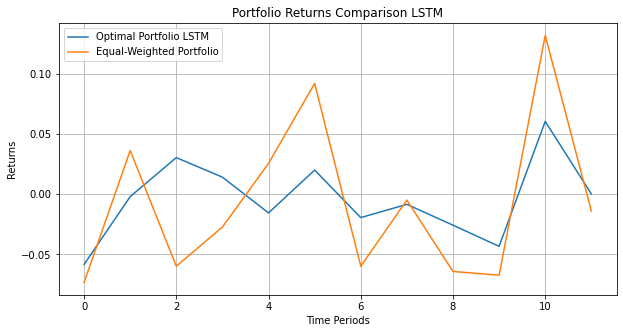

In [88]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_LSTM, label='Optimal Portfolio LSTM')
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison LSTM')
plt.grid(True)

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()


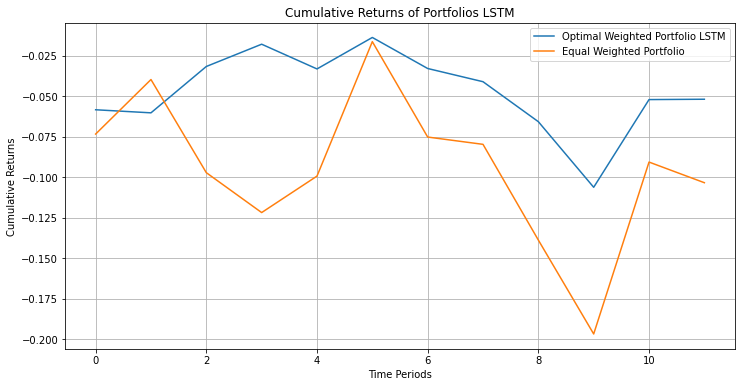

In [89]:
cumulative_returns_LSTM = np.cumprod(1 + np.array(predicted_returns_LSTM)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_LSTM, label='Optimal Weighted Portfolio LSTM')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios LSTM')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# Exponential Smoothing

In [90]:
import pandas as pd
import numpy as np
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

# Load the main stock data
time_series_data = pd.read_excel('Data\SSE_data.xlsx')

# Load the additional P/E and P/BV data
pe_pbv_data = pd.read_excel('Data\Monthly_PE_PBV_Data.xlsx')

# Convert 'Trading Month' into 'Year' and 'Month' for both datasets
time_series_data[['Year', 'Month']] = time_series_data['Trading Month'].str.split('-', expand=True)
pe_pbv_data[['Year', 'Month']] = pe_pbv_data['Month'].str.split('-', expand=True)

# Merging the datasets on 'Stock Code', 'Year' and 'Month'
combined_data = pd.merge(time_series_data, pe_pbv_data, on=['Stock Code', 'Year', 'Month'], how='left')

# Handle missing P/E and P/BV values
combined_data['P/E Ratio'] = combined_data.groupby('Stock Code')['P/E Ratio'].transform(lambda x: x.fillna(x.median()))
combined_data['P/B Ratio'] = combined_data.groupby('Stock Code')['P/B Ratio'].transform(lambda x: x.fillna(x.median()))
combined_data.fillna(combined_data.median(), inplace=True)

# Select relevant numeric columns for the Exponential Smoothing model
numeric_cols = ['Market Value of Tradable Shares', 'Monthly Return Without Cash Dividend Reinvested']

# Convert relevant columns to numeric
combined_data[numeric_cols] = combined_data[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Remove rows with missing values in the numeric columns
combined_data.dropna(subset=numeric_cols, inplace=True)

# Scale the data
scaler = StandardScaler()
combined_data[numeric_cols] = scaler.fit_transform(combined_data[numeric_cols])

# Dictionary to hold predicted results and actuals for MSE calculation
all_predictions = {}
mse_values = []

# Loop through each unique stock code
for stock in combined_data['Stock Code'].unique():
    stock_data = combined_data[(combined_data['Stock Code'] == stock) & (combined_data['Year'].astype(int) <= 2021)]
    
    if stock_data.empty or len(stock_data) < 4:  # Ensuring sufficient data for modeling
        continue

    # Fit Exponential Smoothing model
    model = ExponentialSmoothing(stock_data['Monthly Return Without Cash Dividend Reinvested'], 
                                 trend='add', seasonal='add', seasonal_periods=12)
    try:
        fitted_model = model.fit(optimized=True)
        # Forecast for 2022
        predicted_returns = fitted_model.forecast(steps=12)
        all_predictions[stock] = predicted_returns

        # Fetch actual data for 2022
        actual_data = time_series_data[(time_series_data['Stock Code'] == stock) & (time_series_data['Year'] == '2022')]['Monthly Return Without Cash Dividend Reinvested']
        if len(actual_data) == 12:  # Ensure we have a full year of actual data to compare
            mse = mean_squared_error(actual_data, predicted_returns)
            mse_values.append(mse)
    except Exception as e:
        print(f"Failed to fit Exponential Smoothing for stock {stock}: {e}")
        continue

# Calculate the average MSE across all stocks
average_mse = np.mean(mse_values) if mse_values else float('nan')
#print(all_predictions)
print("Average Mean Squared Error across all stocks:", average_mse)


C:\Users\JEFFER~1\AppData\Local\Temp/ipykernel_7976/1535286094.py:23: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  combined_data.fillna(combined_data.median(), inplace=True)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported inde

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be gi

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be gi

c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be gi

Average Mean Squared Error across all stocks: 0.16548828384843386


c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\users\jefferson\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [91]:
for keys in all_predictions.keys():
    all_predictions[keys] = all_predictions[keys].to_frame().reset_index().drop("index",axis  = 1)

In [92]:
predicted_data = pd.concat(
    [df.assign(stock_code=stock) for stock, df in all_predictions.items()]
)

predicted_data = predicted_data.pivot( columns='stock_code', values=0)
predicted_data

stock_code,600010,600028,600030,600031,600036,600048,600050,600089,600104,600111,...,601390,601398,601628,601633,601668,601669,601857,601888,601899,601919
0,-0.085037,0.108577,-0.172964,-0.154869,0.104944,-0.252115,-0.103959,0.269062,-0.345833,0.419014,...,-0.045414,-0.057313,-0.326756,0.227533,-0.338837,-0.355956,0.011225,0.231822,-0.023048,0.272208
1,0.387158,0.092401,0.125561,0.263081,-0.060298,-0.086107,0.392365,0.328876,-0.102473,1.070384,...,0.440187,-0.191509,-0.115486,0.347981,-0.063908,0.047800,-0.206480,0.165160,0.637796,0.064111
2,0.218702,-0.070821,-0.061287,0.026841,0.124833,0.028844,-0.082145,0.231680,-0.175468,0.900561,...,-0.302640,-0.038362,-0.214785,0.092519,-0.025379,0.202529,-0.277815,0.061614,-0.275071,0.616336
3,0.368947,0.064838,0.065386,-0.124779,0.243732,0.017691,0.224992,0.191925,-0.052835,0.868473,...,-0.190899,-0.093045,0.048358,0.299152,0.208760,0.356082,-0.135938,0.635016,0.286427,0.716227
4,-0.222309,-0.266715,-0.382752,-0.157253,0.150233,-0.348225,-0.610189,0.004636,-0.232676,1.517110,...,0.015889,-0.129659,-0.268232,0.090499,-0.379510,-0.427977,-0.284844,0.334570,0.031113,0.196796
5,-0.432871,-0.193429,-0.301464,-0.141989,-0.112305,-0.122800,0.054358,-0.161510,-0.166342,-0.016825,...,0.323964,-0.053283,-0.178540,0.051515,-0.196870,-0.472809,-0.174546,0.863753,-0.121161,0.646318
6,0.590099,-0.064064,0.032942,-0.009319,0.147318,0.190944,-0.157744,0.610384,-0.189556,2.301948,...,-0.176094,-0.018665,0.136348,1.129151,-0.035151,0.416883,-0.050658,0.197494,0.623947,0.493506
7,0.183211,-0.155061,-0.150135,-0.098351,0.050215,-0.124084,0.538795,0.292521,-0.141857,1.019227,...,-0.505721,-0.229955,-0.080326,-0.106982,-0.268846,-0.005637,-0.306992,-0.081306,0.271259,1.198366
8,-0.191912,0.033987,-0.092580,0.001358,-0.008761,0.028793,-0.358755,0.575388,0.209414,0.447073,...,0.142744,-0.060343,-0.074436,0.602134,-0.228108,-0.090756,0.125003,0.598241,-0.057992,-0.088955
9,-0.255937,0.046287,0.311726,0.242530,0.322973,0.133511,-0.425774,0.264994,0.090470,0.682442,...,-0.353121,0.136643,0.451944,0.390786,0.067615,0.109966,-0.122649,0.370270,0.523469,0.032500


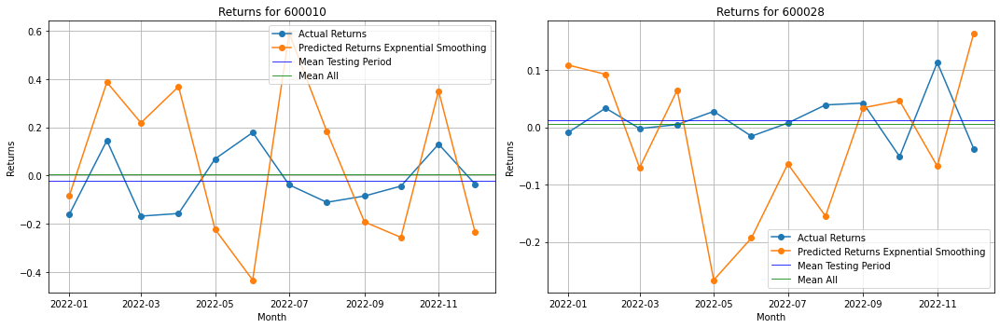

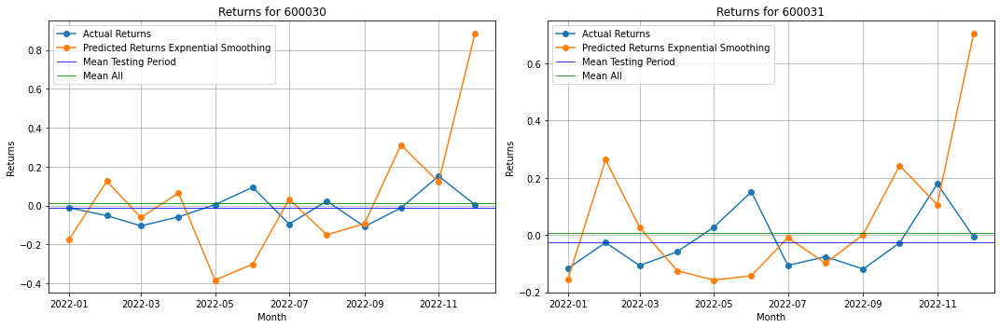

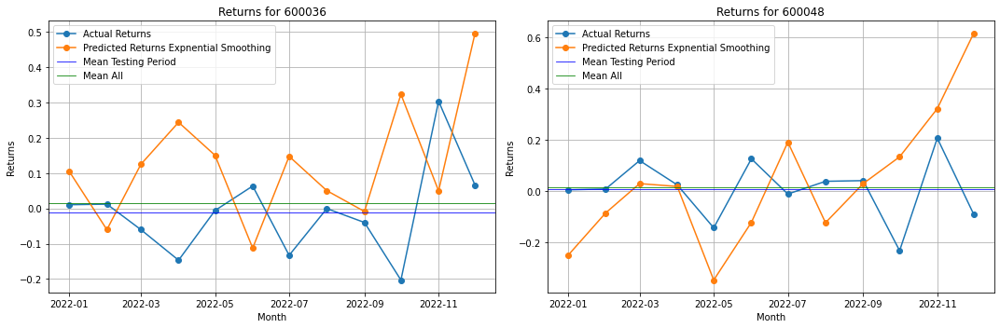

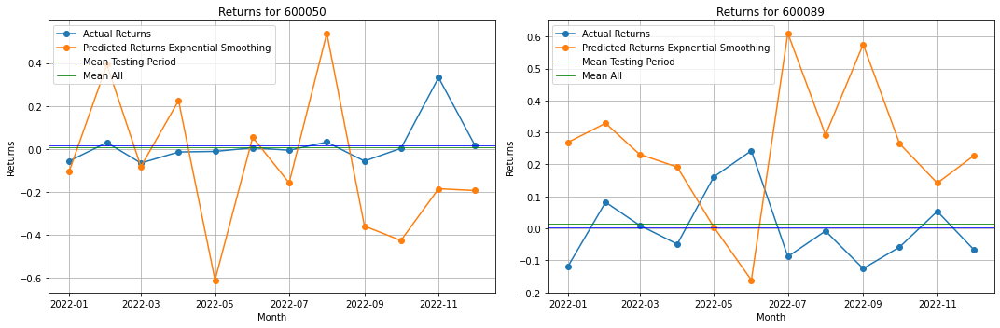

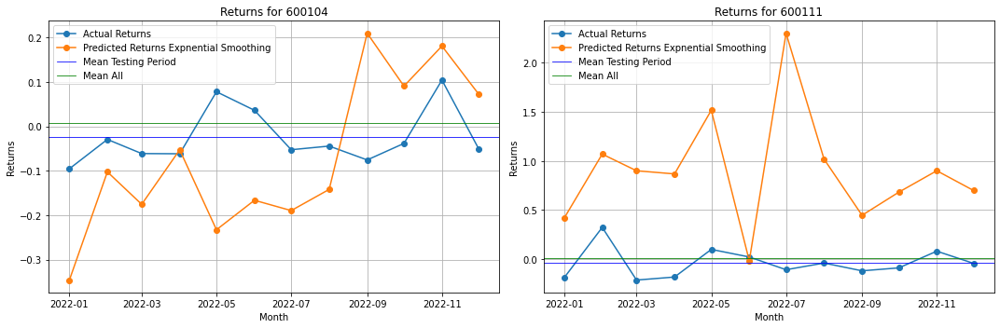

...

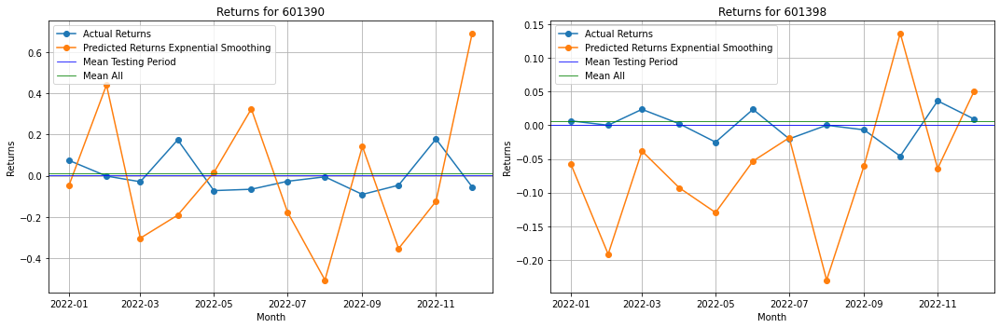

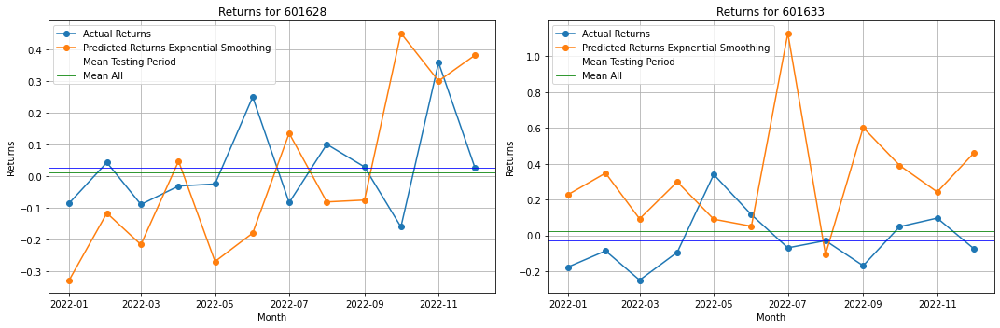

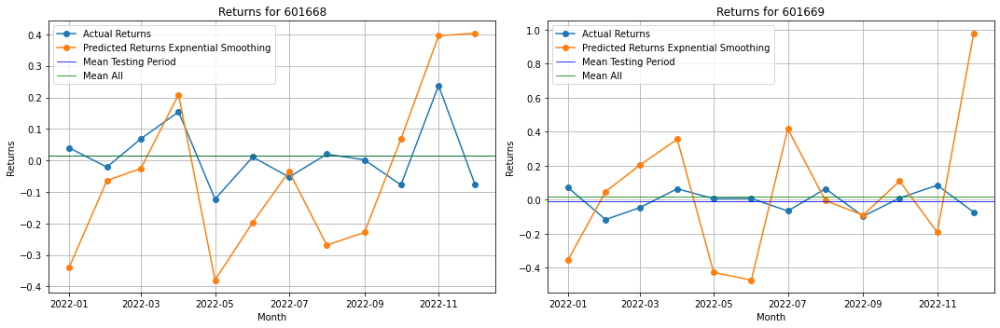

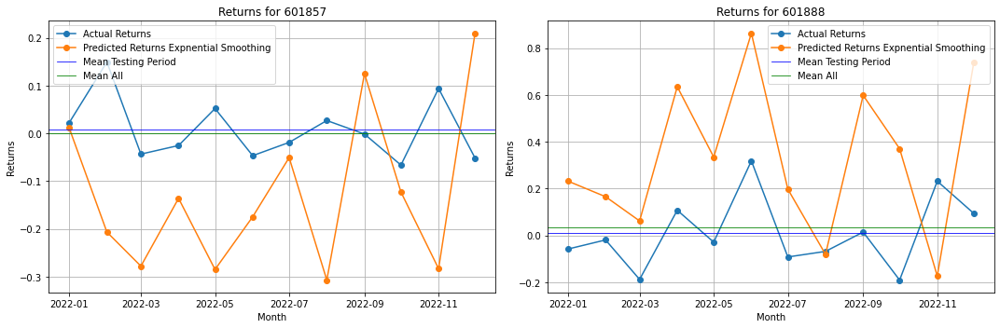

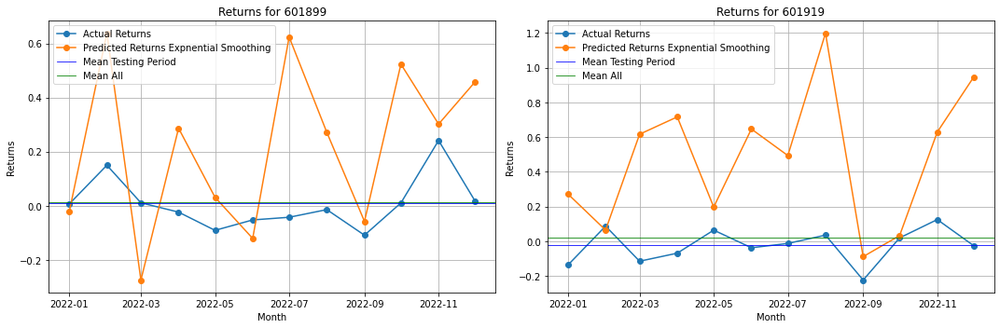

In [93]:
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o', label='Actual Returns')
        ax.plot(testing_period.index, predicted_data[stock], marker='o', label='Predicted Returns Expnential Smoothing')
        
        mean_actual = testing_period[stock].mean()
        ax.axhline(y=mean_actual, color='blue', linestyle='-', linewidth=0.8, label='Mean Testing Period')
        mean_all = data[stock].mean()
        ax.axhline(y=mean_all, color='green', linestyle='-', linewidth=0.8, label='Mean All')
        
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        ax.legend()
        
    plt.tight_layout()
    plt.show()

In [94]:
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_exp = []
market_returns = []
iterations = 0


for months in test_period:
    
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    mean_returns = predicted_data.loc[iterations].values #historical_data.mean() 
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights/= sum(optimal_weights)
    
    actual_returns = data.loc[end_date].values
    mean_returns_god = np.array(actual_returns)
    
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
    
    predicted_returns_exp.append(predicted_returns)
    market_returns.append(equal_weighted_returns)
    
    iterations += 1

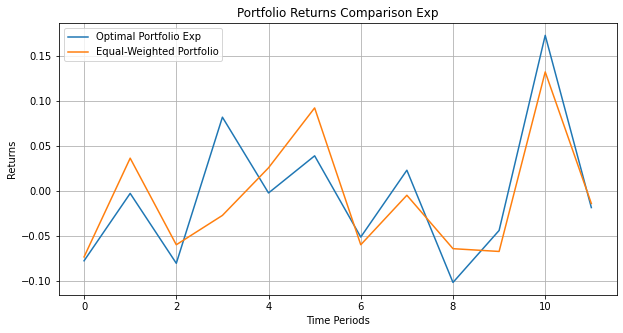

In [95]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_exp, label='Optimal Portfolio Exp')
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison Exp')
plt.grid(True)

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()


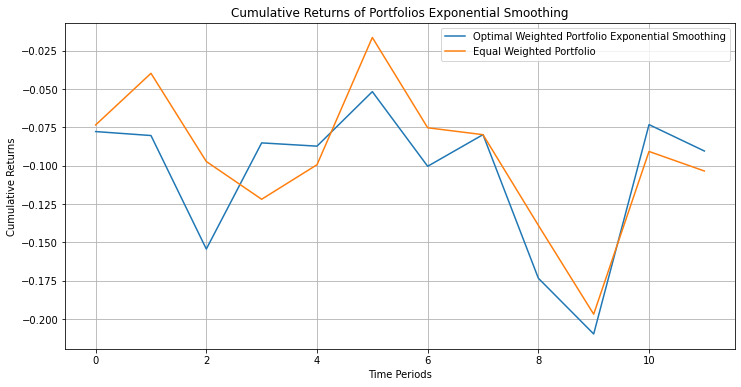

In [96]:
cumulative_returns_exp = np.cumprod(1 + np.array(predicted_returns_exp)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_exp, label='Optimal Weighted Portfolio Exponential Smoothing')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios Exponential Smoothing')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# SVM

In [49]:
import pandas as pd

# Load data from the first Excel file (SSE_data.xlsx)
sse_data = pd.read_excel("Data\SSE_data.xlsx")

# Load data from the second Excel file (Monthly_PE_PBV_Data.xlsx)
monthly_pe_pbv_data = pd.read_excel("Data\Monthly_PE_PBV_Data.xlsx")

# Merge the two datasets on 'Stock Code' and 'Trading Month'
merged_data = pd.merge(sse_data, monthly_pe_pbv_data, how='inner', left_on=['Stock Code', 'Trading Month'], right_on=['Stock Code', 'Month'])

# Drop unnecessary columns
merged_data.drop(columns=['Month'], inplace=True)

# Check for missing values and data types
merged_data_info = merged_data.info()
merged_data_missing_values = merged_data.isnull().sum()

# Impute missing values using the median for the specified columns
columns_to_impute = ['Monthly Return With Cash Dividend Reinvested',
                     'Monthly Return Without Cash Dividend Reinvested',
                     'P/E Ratio']

for column in columns_to_impute:
    median_value = merged_data[column].median()
    merged_data[column].fillna(median_value, inplace=True)

# Verify if all missing values have been handled
missing_values_after_imputation = merged_data.isnull().sum()



from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Prepare the data with the necessary shifts and filtering
merged_data['Future Return'] = merged_data['Monthly Return Without Cash Dividend Reinvested'].shift(-1)
#merged_data.dropna(subset=['Future Return'], inplace=True)  # Remove rows with NaN in target variable

# Define the feature matrix and target vector
features = merged_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
target = merged_data['Future Return']

# Split the data (keeping data from 2010 to 2021 for training and 2022 for testing)
training_data = merged_data[merged_data['Trading Month'] < '2022-01']
testing_data = merged_data[merged_data['Trading Month'] >= '2022-01']#'2021-12']

X_train = training_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_train = training_data['Future Return']
X_test = testing_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_test = testing_data['Monthly Return Without Cash Dividend Reinvested']


# Create and train the Support Vector Machine (SVM) model
svm_model = SVR()
svm_model.fit(X_train, y_train)
# print(len(X_test))
svm_predictions = svm_model.predict(X_test)
svm_mse = mean_squared_error(y_test, svm_predictions)
svm_r2 = r2_score(y_test, svm_predictions)


print("svm")
print(svm_mse, svm_r2)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5789 entries, 0 to 5788
Data columns (total 13 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Stock Code                                       5789 non-null   int64  
 1   Trading Month                                    5789 non-null   object 
 2   Monthly Opening Price                            5789 non-null   float64
 3   Monthly Closing Price                            5789 non-null   float64
 4   Number of Shares Traded in Month                 5789 non-null   int64  
 5   Value of Shares Traded in Month                  5789 non-null   int64  
 6   Market Value of Tradable Shares                  5789 non-null   float64
 7   Total Market Value                               5789 non-null   float64
 8   Number Of Days Of Monthly Trading                5789 non-null   int64  
 9   Monthly Return With Cash Divid

In [50]:
results_df = pd.DataFrame({
    'Actual Returns': y_test,
    'Predicted Returns': svm_predictions #rf_predictions #svm_predictions
}, index=testing_data.index)
results_df['Stock Code'] = testing_data['Stock Code']
results_df['Trading Month'] = testing_data['Trading Month']
results_df

,Actual Returns,Predicted Returns,Stock Code,Trading Month
143,-0.161290,0.017177,600010,2022-01
144,0.145299,0.016386,600010,2022-02
145,-0.167910,0.017456,600010,2022-03
146,-0.156951,0.018416,600010,2022-04
147,0.069149,0.018046,600010,2022-05
...,...,...,...,...
5784,0.034985,0.012625,601919,2022-08
5785,-0.223944,0.013660,601919,2022-09
5786,0.019056,0.013573,601919,2022-10
5787,0.124666,0.013070,601919,2022-11


In [51]:
predicted_data = results_df.pivot(index= "Trading Month",columns='Stock Code', values='Predicted Returns')

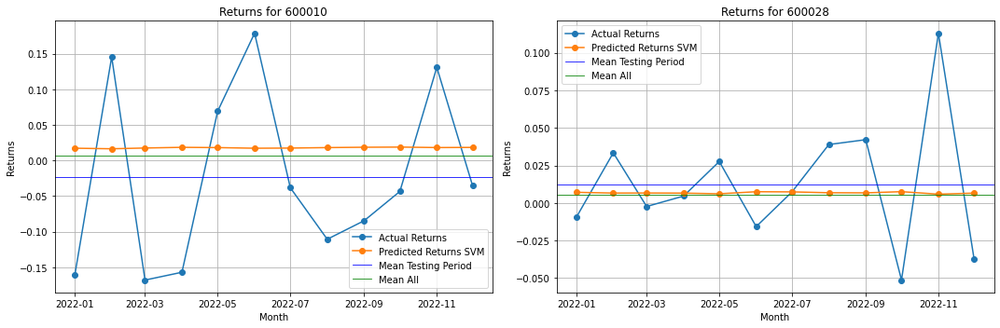

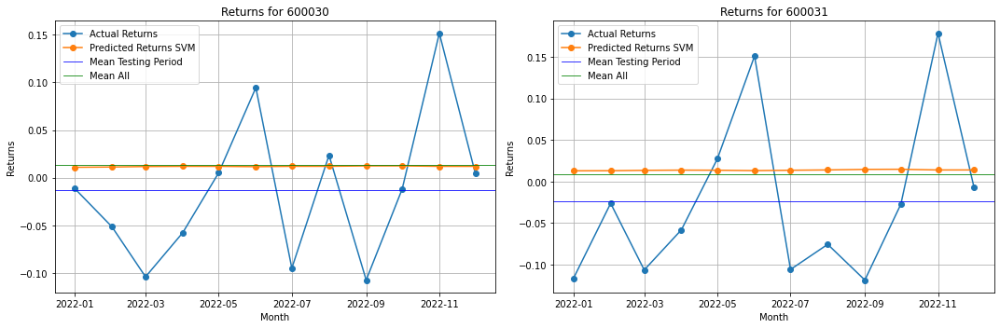

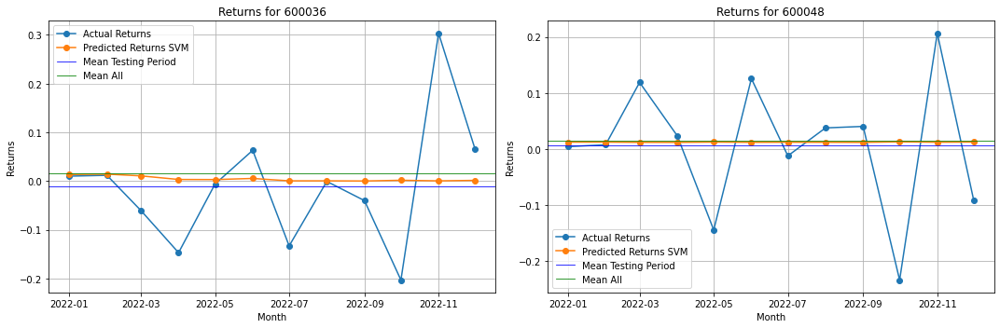

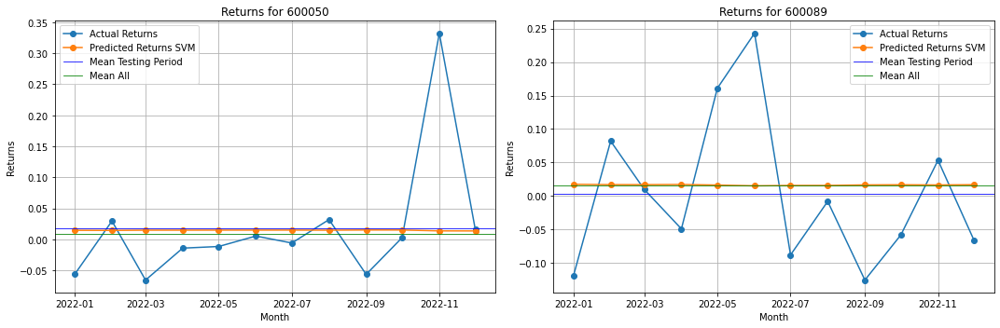

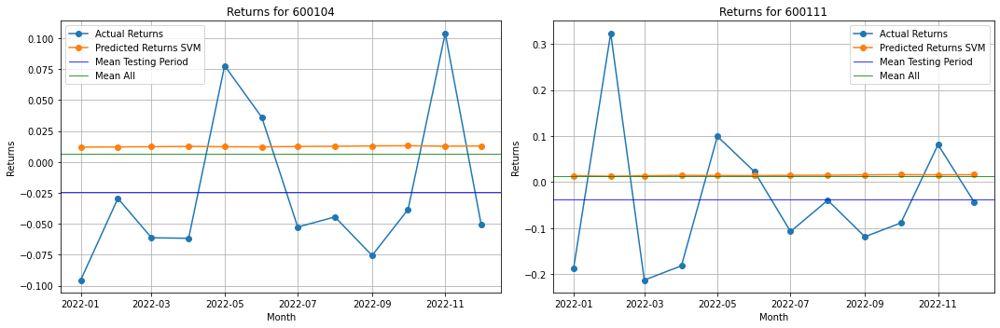

...

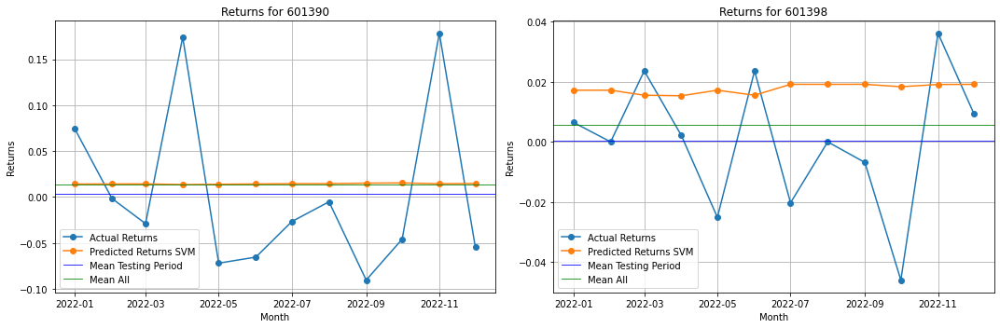

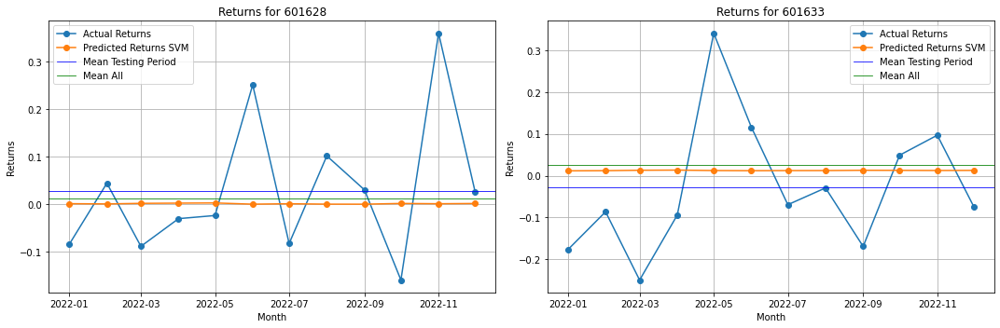

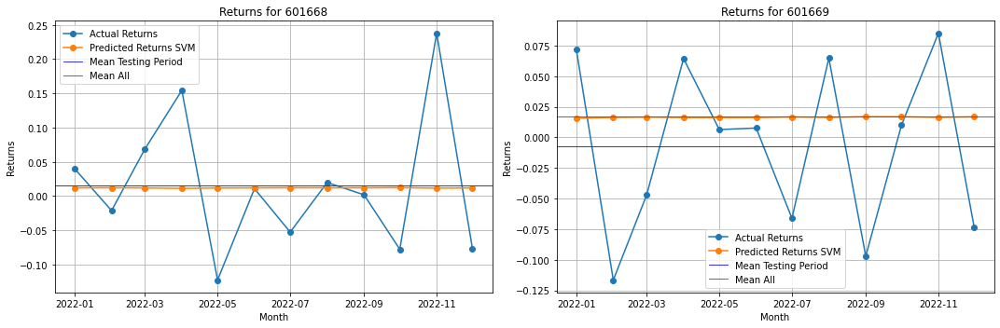

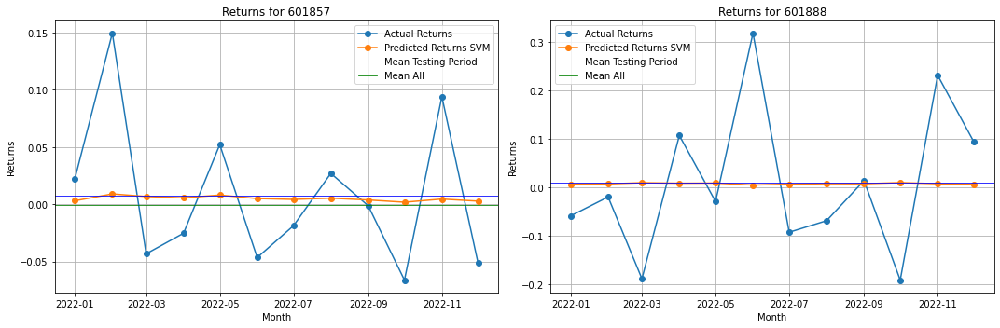

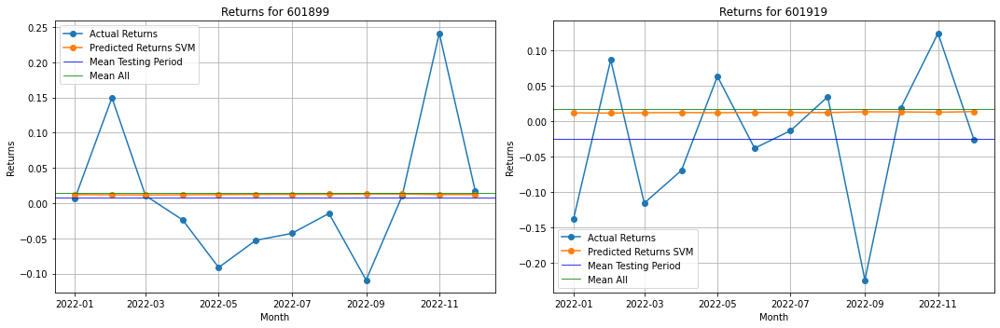

In [52]:
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o', label='Actual Returns')
        ax.plot(testing_period.index, predicted_data[stock], marker='o', label='Predicted Returns SVM')
        
        mean_actual = testing_period[stock].mean()
        ax.axhline(y=mean_actual, color='blue', linestyle='-', linewidth=0.8, label='Mean Testing Period')
        mean_all = data[stock].mean()
        ax.axhline(y=mean_all, color='green', linestyle='-', linewidth=0.8, label='Mean All')
        
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        ax.legend()
        
    plt.tight_layout()
    plt.show()

In [53]:
results_df['Stock Code'] = testing_data['Stock Code']
results_df['Trading Month'] = testing_data['Trading Month']

# Reorder columns to make it more readable
results_df = results_df[['Stock Code', 'Trading Month', 'Actual Returns', 'Predicted Returns']]
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_SVM = []
market_returns = []

for months in test_period:
    monthly_data = results_df[results_df["Trading Month"] == months]
    mean_returns = np.array(monthly_data["Predicted Returns"].values)
    
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    
       
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights/= sum(optimal_weights)
    
    actual_returns = data.loc[end_date].values
    #mean_returns_god = np.array(actual_returns)
    mean_returns_god = historical_data.mean()
    
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
    
    predicted_returns_SVM.append(predicted_returns)
    market_returns.append(equal_weighted_returns)

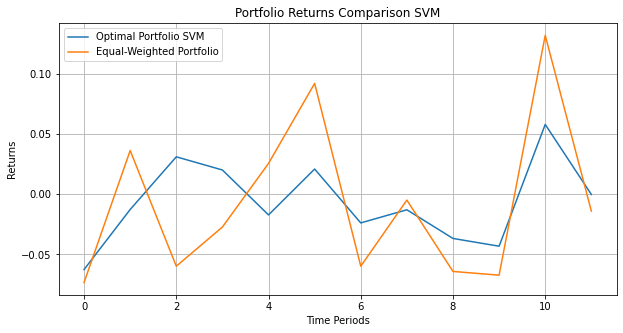

In [54]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_SVM, label='Optimal Portfolio SVM')
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison SVM')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.grid(True)
plt.show()


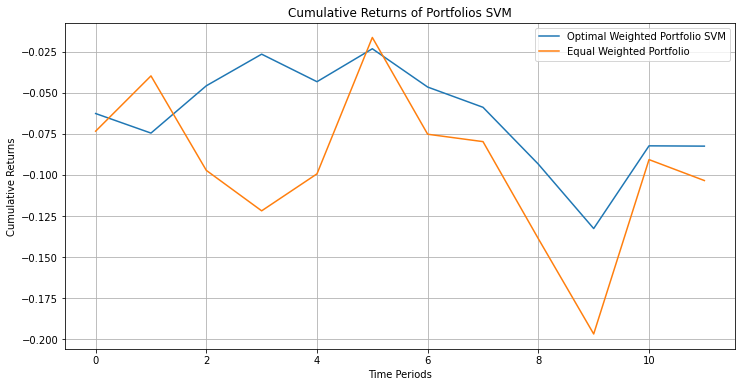

In [55]:
cumulative_returns_SVM = np.cumprod(1 + np.array(predicted_returns_SVM)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_SVM, label='Optimal Weighted Portfolio SVM')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios SVM')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# GBM

In [56]:
import pandas as pd

# Load data from the first Excel file (SSE_data.xlsx)
sse_data = pd.read_excel("Data\SSE_data.xlsx")

# Load data from the second Excel file (Monthly_PE_PBV_Data.xlsx)
monthly_pe_pbv_data = pd.read_excel("Data\Monthly_PE_PBV_Data.xlsx")

# Merge the two datasets on 'Stock Code' and 'Trading Month'
merged_data = pd.merge(sse_data, monthly_pe_pbv_data, how='inner', left_on=['Stock Code', 'Trading Month'], right_on=['Stock Code', 'Month'])

# Drop unnecessary columns
merged_data.drop(columns=['Month'], inplace=True)

# Check for missing values and data types
merged_data_info = merged_data.info()
merged_data_missing_values = merged_data.isnull().sum()

# Impute missing values using the median for the specified columns
columns_to_impute = ['Monthly Return With Cash Dividend Reinvested',
                     'Monthly Return Without Cash Dividend Reinvested',
                     'P/E Ratio']

for column in columns_to_impute:
    median_value = merged_data[column].median()
    merged_data[column].fillna(median_value, inplace=True)

# Verify if all missing values have been handled
missing_values_after_imputation = merged_data.isnull().sum()



from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Prepare the data with the necessary shifts and filtering
merged_data['Future Return'] = merged_data['Monthly Return Without Cash Dividend Reinvested'].shift(-1)
#merged_data.dropna(subset=['Future Return'], inplace=True)  # Remove rows with NaN in target variable

# Define the feature matrix and target vector
features = merged_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
target = merged_data['Future Return']

# Split the data (keeping data from 2010 to 2021 for training and 2022 for testing)
training_data = merged_data[merged_data['Trading Month'] < '2022-01']
testing_data = merged_data[merged_data['Trading Month'] >= '2022-01']

X_train = training_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_train = training_data['Future Return']
X_test = testing_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_test = testing_data['Monthly Return Without Cash Dividend Reinvested']

# Create and train the Gradient Boosting Machine (GBM) model
gbm_model = GradientBoostingRegressor(random_state=42)
gbm_model.fit(X_train, y_train)
gbm_predictions = gbm_model.predict(X_test)
gbm_mse = mean_squared_error(y_test, gbm_predictions)
gbm_r2 = r2_score(y_test, gbm_predictions)

print("gbm")
print(gbm_mse, gbm_r2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5789 entries, 0 to 5788
Data columns (total 13 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Stock Code                                       5789 non-null   int64  
 1   Trading Month                                    5789 non-null   object 
 2   Monthly Opening Price                            5789 non-null   float64
 3   Monthly Closing Price                            5789 non-null   float64
 4   Number of Shares Traded in Month                 5789 non-null   int64  
 5   Value of Shares Traded in Month                  5789 non-null   int64  
 6   Market Value of Tradable Shares                  5789 non-null   float64
 7   Total Market Value                               5789 non-null   float64
 8   Number Of Days Of Monthly Trading                5789 non-null   int64  
 9   Monthly Return With Cash Divid

In [57]:
results_df = pd.DataFrame({
    'Actual Returns': y_test,
    'Predicted Returns': gbm_predictions #rf_predictions #svm_predictions
}, index=testing_data.index)

results_df['Stock Code'] = testing_data['Stock Code']
results_df['Trading Month'] = testing_data['Trading Month']
results_df

,Actual Returns,Predicted Returns,Stock Code,Trading Month
143,-0.161290,0.010194,600010,2022-01
144,0.145299,0.015258,600010,2022-02
145,-0.167910,0.010194,600010,2022-03
146,-0.156951,0.009248,600010,2022-04
147,0.069149,0.008302,600010,2022-05
...,...,...,...,...
5784,0.034985,0.114046,601919,2022-08
5785,-0.223944,0.077001,601919,2022-09
5786,0.019056,0.112817,601919,2022-10
5787,0.124666,0.167874,601919,2022-11


In [58]:
predicted_data = results_df.pivot(index= "Trading Month",columns='Stock Code', values='Predicted Returns')

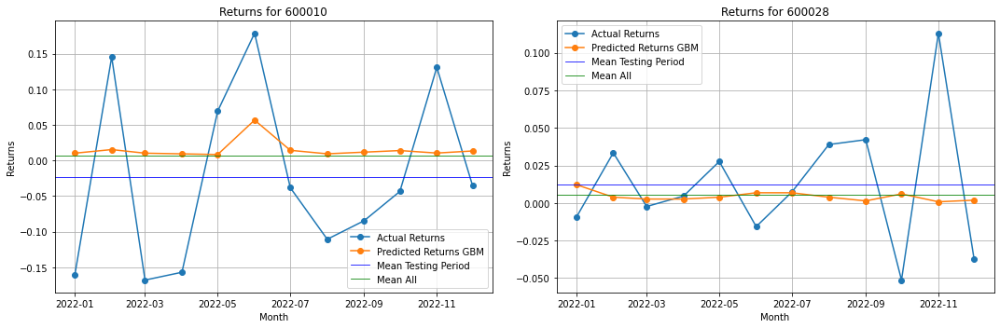

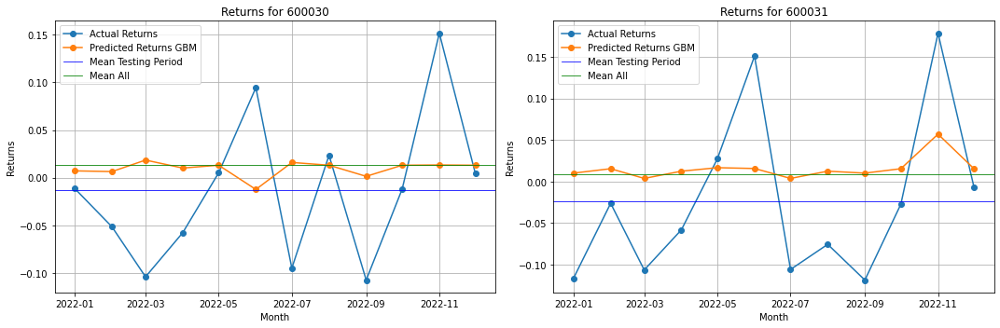

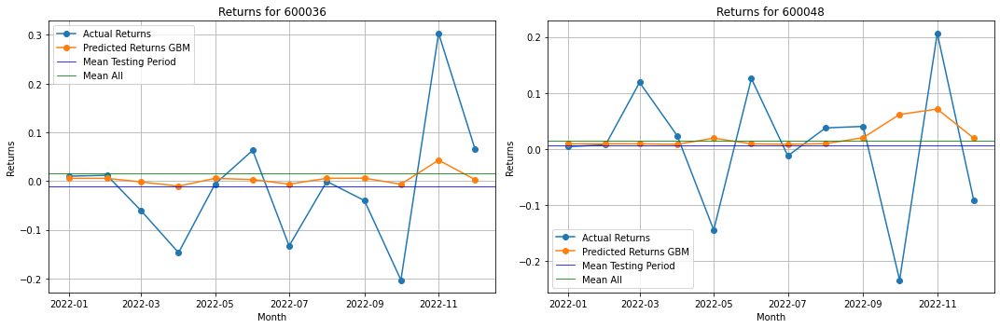

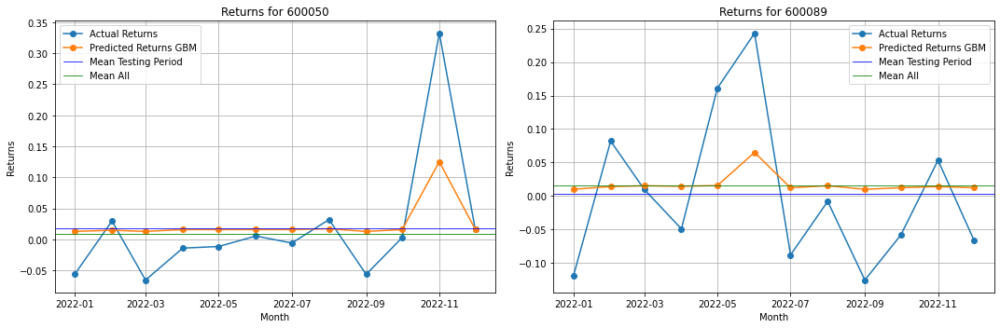

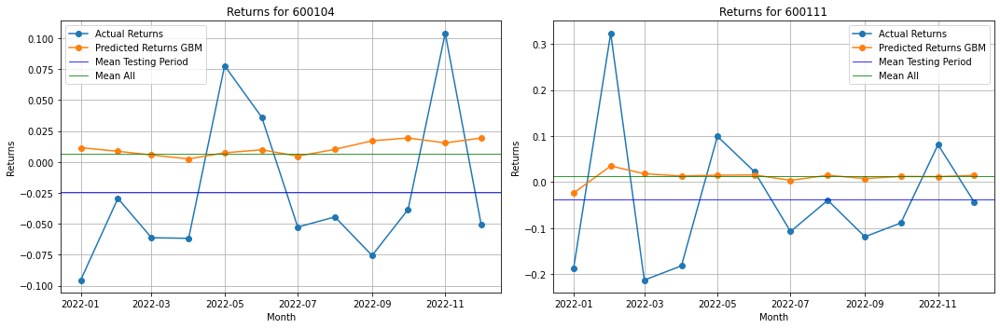

...

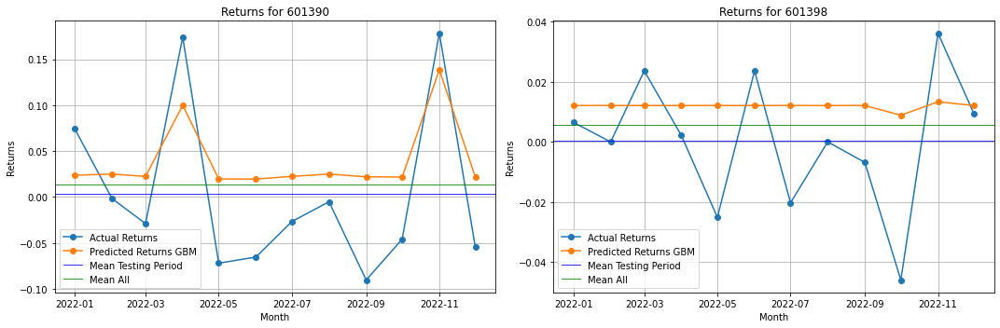

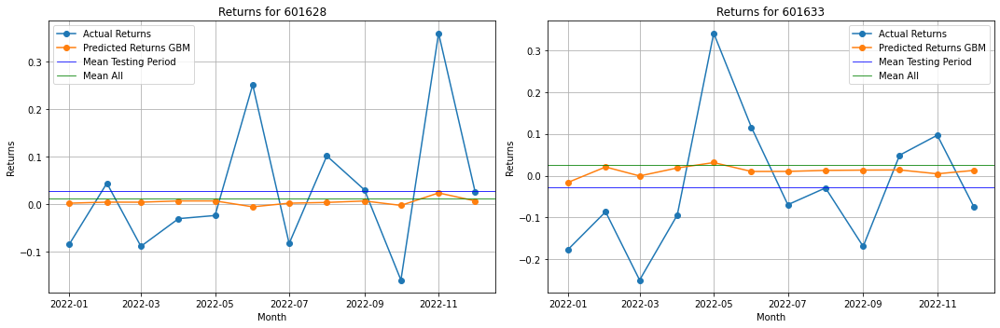

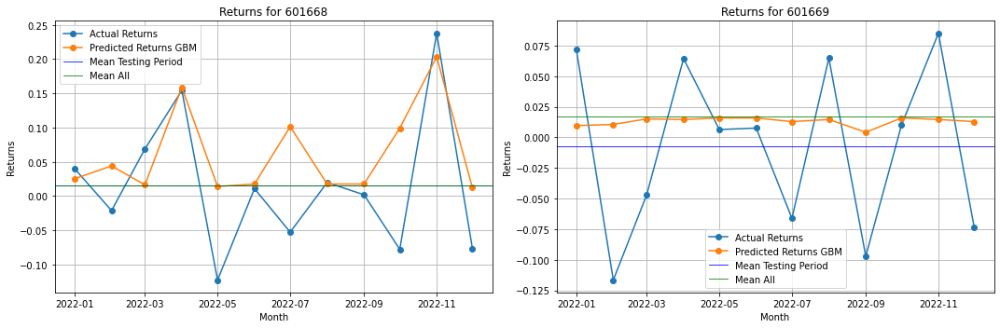

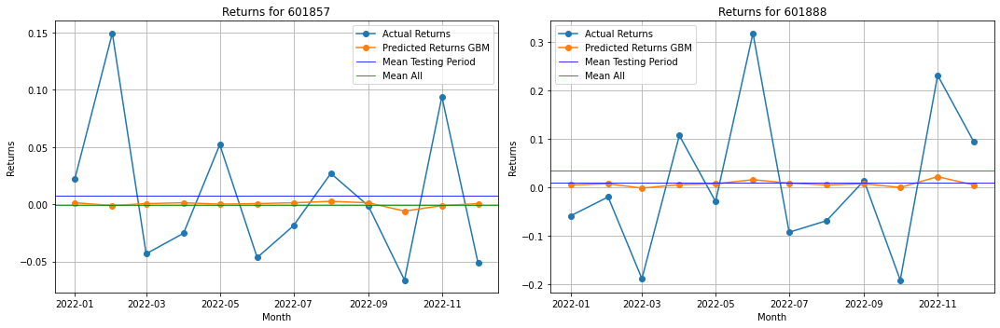

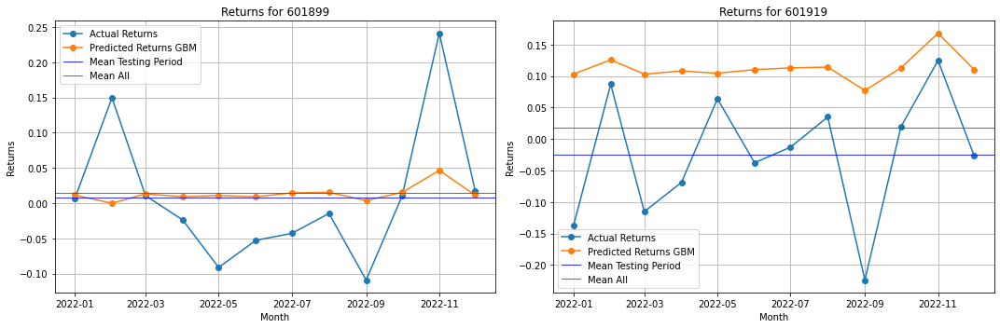

In [59]:
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o', label='Actual Returns')
        ax.plot(testing_period.index, predicted_data[stock], marker='o', label='Predicted Returns GBM')
        
        mean_actual = testing_period[stock].mean()
        ax.axhline(y=mean_actual, color='blue', linestyle='-', linewidth=0.8, label='Mean Testing Period')
        mean_all = data[stock].mean()
        ax.axhline(y=mean_all, color='green', linestyle='-', linewidth=0.8, label='Mean All')
        
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        ax.legend()
        
    plt.tight_layout()
    plt.show()

In [60]:
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_GBM = []
market_returns = []

for months in test_period:
    monthly_data = results_df[results_df["Trading Month"] == months]
    mean_returns = np.array(monthly_data["Predicted Returns"].values)
    
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    
       
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights/= sum(optimal_weights)
    
    actual_returns = data.loc[end_date].values
    mean_returns_god = historical_data.mean()
    
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
        
    predicted_returns_GBM.append(predicted_returns)
    market_returns.append(equal_weighted_returns)

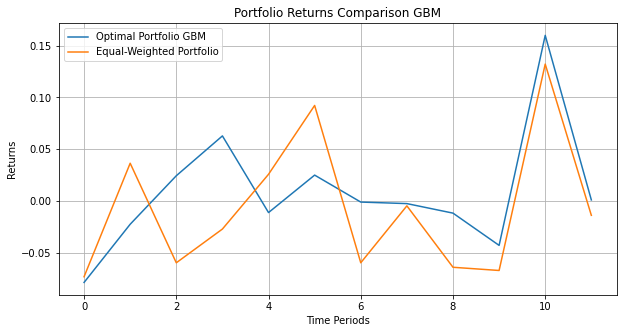

In [61]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_GBM, label='Optimal Portfolio GBM')
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison GBM')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.grid(True)
plt.show()


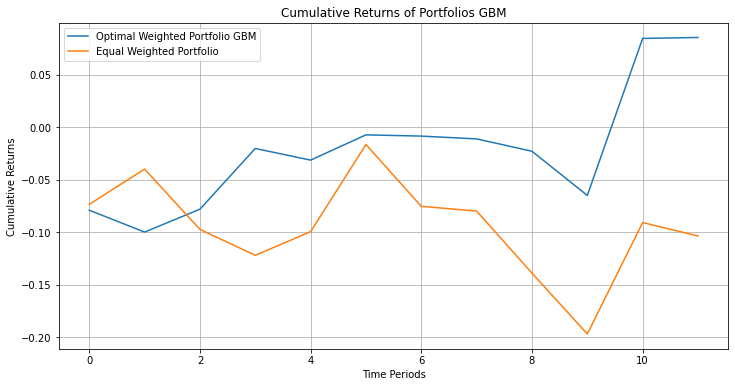

In [62]:
cumulative_returns_GBM = np.cumprod(1 + np.array(predicted_returns_GBM)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_GBM, label='Optimal Weighted Portfolio GBM')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios GBM')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# Random Forest

In [63]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Load data from the first Excel file (SSE_data.xlsx)
sse_data = pd.read_excel("Data\SSE_data.xlsx")

# Load data from the second Excel file (Monthly_PE_PBV_Data.xlsx)
monthly_pe_pbv_data = pd.read_excel("Data\Monthly_PE_PBV_Data.xlsx")


# Merge the two datasets on 'Stock Code' and 'Trading Month'
merged_data = pd.merge(sse_data, monthly_pe_pbv_data, how='inner', left_on=['Stock Code', 'Trading Month'], right_on=['Stock Code', 'Month'])

# Drop unnecessary columns
merged_data.drop(columns=['Month'], inplace=True)

# Check for missing values and data types
merged_data_info = merged_data.info()
merged_data_missing_values = merged_data.isnull().sum()


# Impute missing values using the median for the specified columns
columns_to_impute = ['Monthly Return With Cash Dividend Reinvested',
                     'Monthly Return Without Cash Dividend Reinvested',
                     'P/E Ratio']

for column in columns_to_impute:
    median_value = merged_data[column].median()
    merged_data[column].fillna(median_value, inplace=True)

# Verify if all missing values have been handled
missing_values_after_imputation = merged_data.isnull().sum()

# Prepare the data with the necessary shifts and filtering
merged_data['Future Return'] = merged_data['Monthly Return Without Cash Dividend Reinvested'].shift(-1)
#merged_data.dropna(subset=['Future Return'], inplace=True)  # Remove rows with NaN in target variable

# Define the feature matrix and target vector
features = merged_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
target = merged_data['Future Return']

# Split the data (keeping data from 2010 to 2021 for training and 2022 for testing)
training_data = merged_data[merged_data['Trading Month'] < '2022-01']
testing_data = merged_data[merged_data['Trading Month'] >= '2022-01']

X_train = training_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_train = training_data['Future Return']
X_test = testing_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_test = testing_data['Monthly Return Without Cash Dividend Reinvested']


# Create and train the Random Forest model
random_forest_model = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest_model.fit(X_train, y_train)

# Predict the future returns on the testing set
rf_predictions = random_forest_model.predict(X_test)

# Calculate performance metrics for the Random Forest model
rf_mse = mean_squared_error(y_test, rf_predictions)
rf_r2 = r2_score(y_test, rf_predictions)

print("rf")
print(rf_mse, rf_r2)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5789 entries, 0 to 5788
Data columns (total 13 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Stock Code                                       5789 non-null   int64  
 1   Trading Month                                    5789 non-null   object 
 2   Monthly Opening Price                            5789 non-null   float64
 3   Monthly Closing Price                            5789 non-null   float64
 4   Number of Shares Traded in Month                 5789 non-null   int64  
 5   Value of Shares Traded in Month                  5789 non-null   int64  
 6   Market Value of Tradable Shares                  5789 non-null   float64
 7   Total Market Value                               5789 non-null   float64
 8   Number Of Days Of Monthly Trading                5789 non-null   int64  
 9   Monthly Return With Cash Divid

In [64]:
results_df = pd.DataFrame({
    'Actual Returns': y_test,
    'Predicted Returns': rf_predictions #rf_predictions #svm_predictions
}, index=testing_data.index)

results_df['Stock Code'] = testing_data['Stock Code']
results_df['Trading Month'] = testing_data['Trading Month']
results_df

,Actual Returns,Predicted Returns,Stock Code,Trading Month
143,-0.161290,-0.021753,600010,2022-01
144,0.145299,0.043061,600010,2022-02
145,-0.167910,-0.008078,600010,2022-03
146,-0.156951,0.005070,600010,2022-04
147,0.069149,-0.034075,600010,2022-05
...,...,...,...,...
5784,0.034985,0.106817,601919,2022-08
5785,-0.223944,0.038987,601919,2022-09
5786,0.019056,0.116720,601919,2022-10
5787,0.124666,0.121956,601919,2022-11


In [65]:
predicted_data = results_df.pivot(index= "Trading Month",columns='Stock Code', values='Predicted Returns')

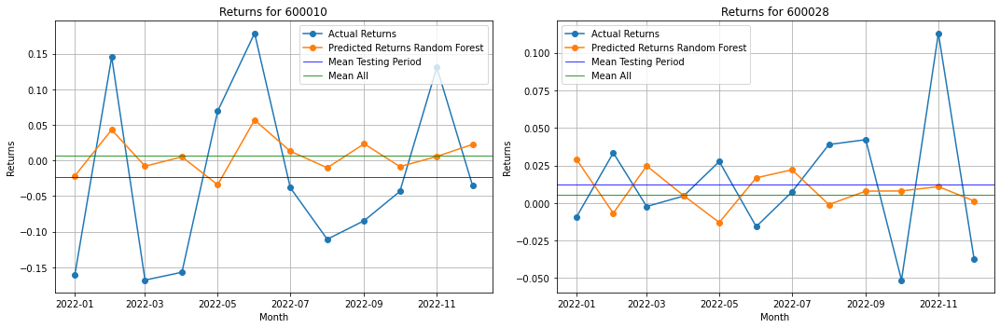

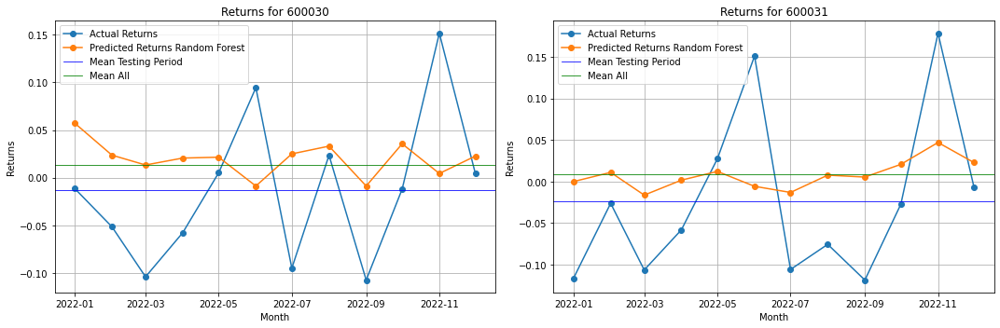

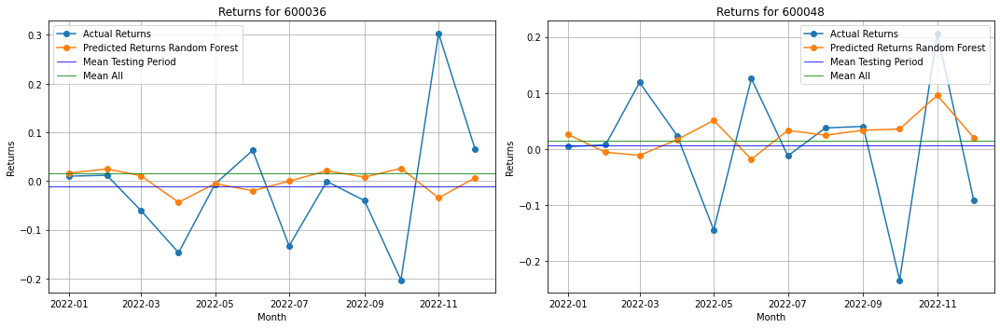

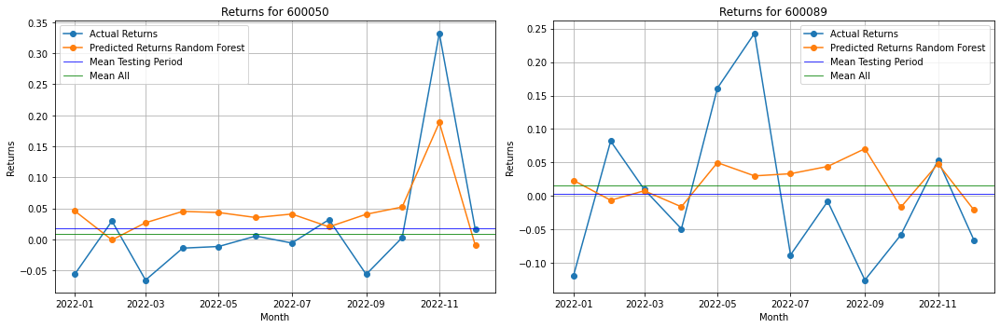

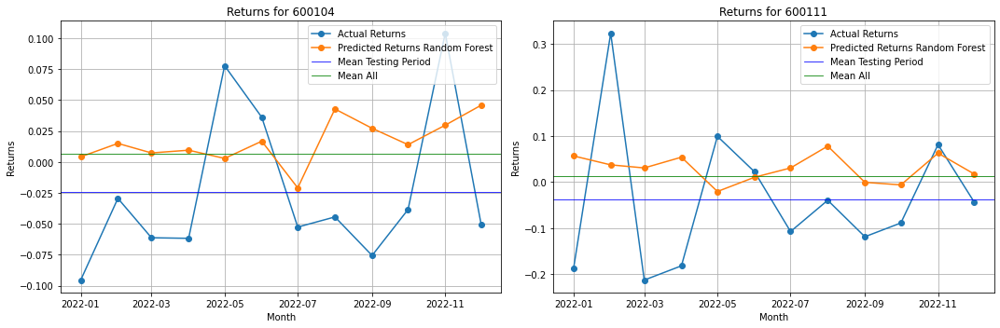

...

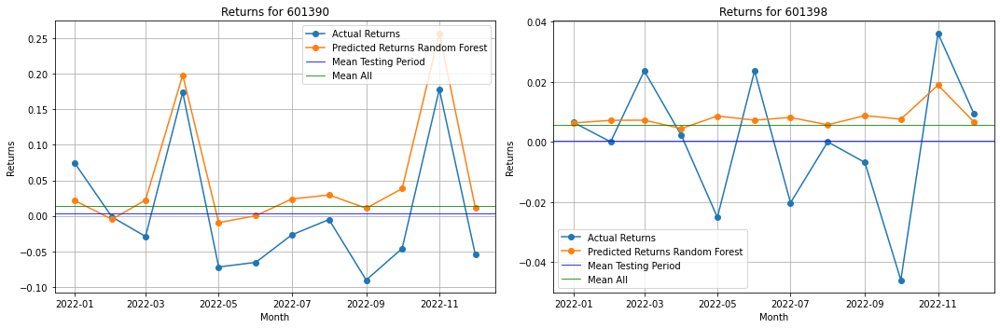

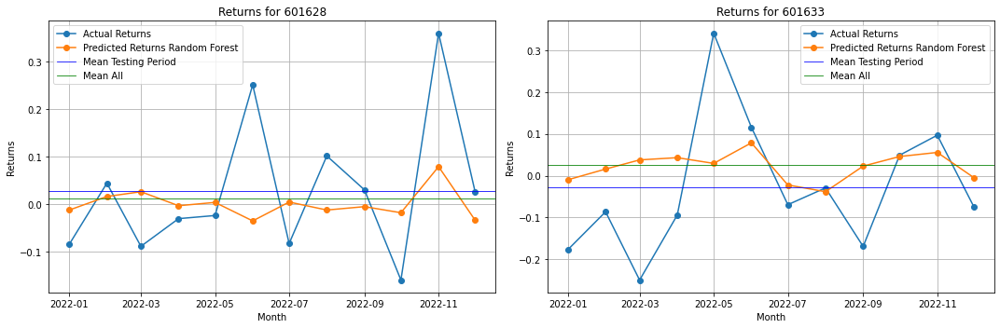

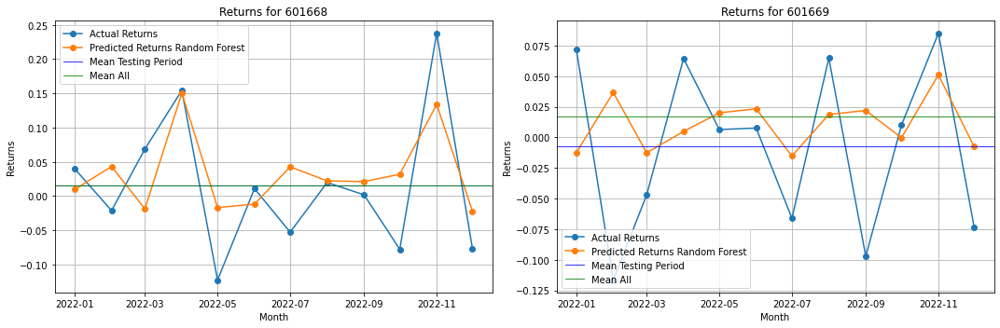

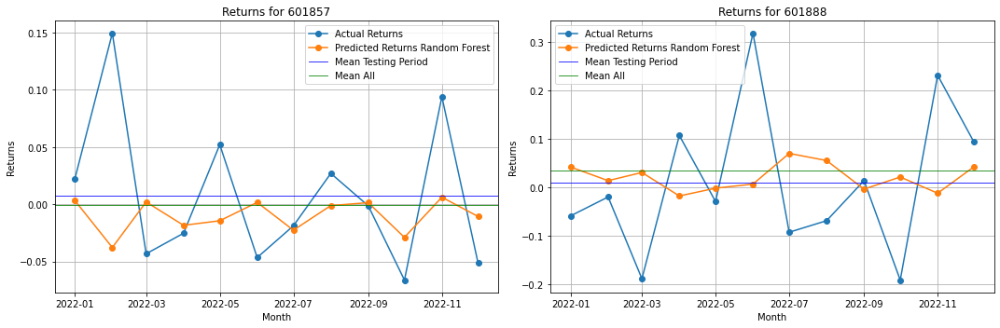

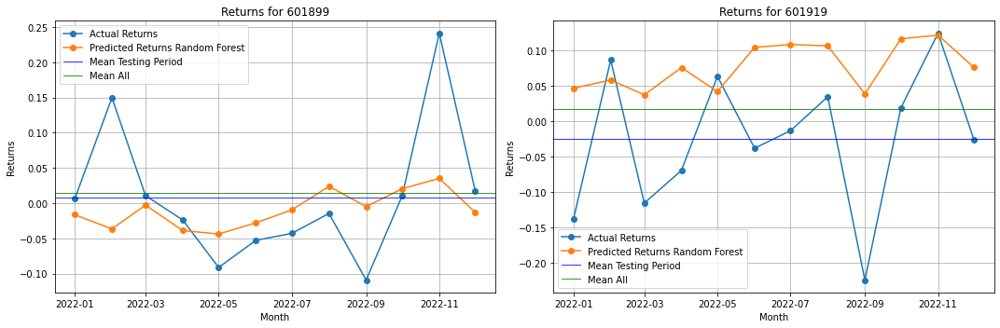

In [66]:
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o', label='Actual Returns')
        ax.plot(testing_period.index, predicted_data[stock], marker='o', label='Predicted Returns Random Forest')
        
        mean_actual = testing_period[stock].mean()
        ax.axhline(y=mean_actual, color='blue', linestyle='-', linewidth=0.8, label='Mean Testing Period')
        mean_all = data[stock].mean()
        ax.axhline(y=mean_all, color='green', linestyle='-', linewidth=0.8, label='Mean All')
        
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        ax.legend()
        
    plt.tight_layout()
    plt.show()

In [67]:
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_RF = []
market_returns = []

for months in test_period:
    monthly_data = results_df[results_df["Trading Month"] == months]
    mean_returns = np.array(monthly_data["Predicted Returns"].values)
    
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    
       
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights/= sum(optimal_weights)
    
    actual_returns = data.loc[end_date].values
    mean_returns_god = historical_data.mean()
    
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
        
    predicted_returns_RF.append(predicted_returns)
    market_returns.append(equal_weighted_returns)

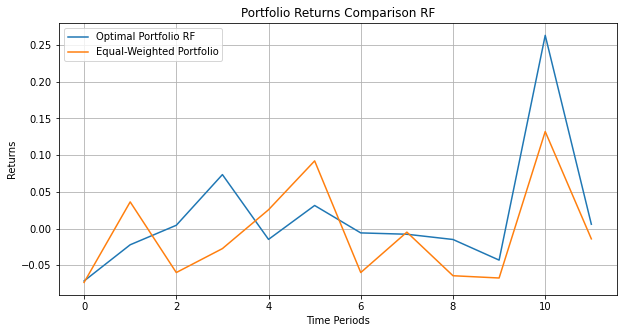

In [68]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_RF, label='Optimal Portfolio RF')
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison RF')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.grid(True)
plt.show()


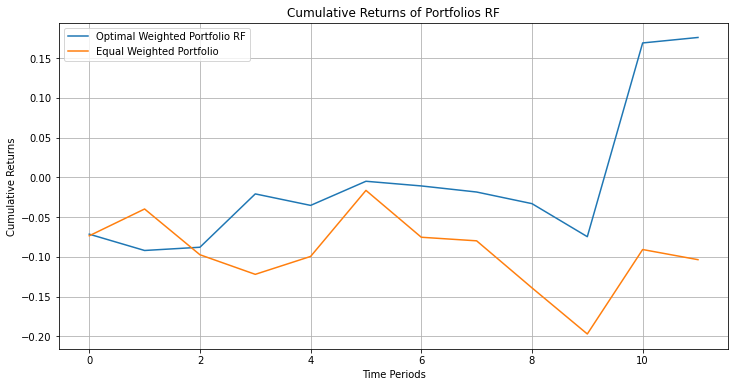

In [69]:
cumulative_returns_rf = np.cumprod(1 + np.array(predicted_returns_RF)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_rf, label='Optimal Weighted Portfolio RF')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios RF')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# Linear Regression

In [70]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


# Load data from the first Excel file (SSE_data.xlsx)
sse_data = pd.read_excel("Data\SSE_data.xlsx")

# Load data from the second Excel file (Monthly_PE_PBV_Data.xlsx)
monthly_pe_pbv_data = pd.read_excel("Data\Monthly_PE_PBV_Data.xlsx")


# Merge the two datasets on 'Stock Code' and 'Trading Month'
merged_data = pd.merge(sse_data, monthly_pe_pbv_data, how='inner', left_on=['Stock Code', 'Trading Month'], right_on=['Stock Code', 'Month'])

# Drop unnecessary columns
merged_data.drop(columns=['Month'], inplace=True)

# Check for missing values and data types
merged_data_info = merged_data.info()
merged_data_missing_values = merged_data.isnull().sum()


# Impute missing values using the median for the specified columns
columns_to_impute = ['Monthly Return With Cash Dividend Reinvested',
                     'Monthly Return Without Cash Dividend Reinvested',
                     'P/E Ratio']

for column in columns_to_impute:
    median_value = merged_data[column].median()
    merged_data[column].fillna(median_value, inplace=True)

# Verify if all missing values have been handled
missing_values_after_imputation = merged_data.isnull().sum()

# Prepare the data with the necessary shifts and filtering
merged_data['Future Return'] = merged_data['Monthly Return Without Cash Dividend Reinvested'].shift(-1)
#merged_data.dropna(subset=['Future Return'], inplace=True)  # Remove rows with NaN in target variable

# Define the feature matrix and target vector
features = merged_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
target = merged_data['Future Return']

# Split the data (keeping data from 2010 to 2021 for training and 2022 for testing)
training_data = merged_data[merged_data['Trading Month'] < '2022-01']
testing_data = merged_data[merged_data['Trading Month'] >= '2022-01']

X_train = training_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_train = training_data['Future Return']
X_test = testing_data[['P/E Ratio', 'P/B Ratio', 'Monthly Return Without Cash Dividend Reinvested', 'Market Value of Tradable Shares']]
y_test = testing_data['Monthly Return Without Cash Dividend Reinvested']

# Create and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict the future returns on the testing set
predictions = model.predict(X_test)

# Calculate performance metrics
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print("lr")
print(mse, r2)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5789 entries, 0 to 5788
Data columns (total 13 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Stock Code                                       5789 non-null   int64  
 1   Trading Month                                    5789 non-null   object 
 2   Monthly Opening Price                            5789 non-null   float64
 3   Monthly Closing Price                            5789 non-null   float64
 4   Number of Shares Traded in Month                 5789 non-null   int64  
 5   Value of Shares Traded in Month                  5789 non-null   int64  
 6   Market Value of Tradable Shares                  5789 non-null   float64
 7   Total Market Value                               5789 non-null   float64
 8   Number Of Days Of Monthly Trading                5789 non-null   int64  
 9   Monthly Return With Cash Divid

In [71]:
results_df = pd.DataFrame({
    'Actual Returns': y_test,
    'Predicted Returns': predictions
}, index=testing_data.index)

results_df['Stock Code'] = testing_data['Stock Code']
results_df['Trading Month'] = testing_data['Trading Month']
results_df

,Actual Returns,Predicted Returns,Stock Code,Trading Month
143,-0.161290,0.012645,600010,2022-01
144,0.145299,0.023176,600010,2022-02
145,-0.167910,0.012479,600010,2022-03
146,-0.156951,0.013071,600010,2022-04
147,0.069149,0.020909,600010,2022-05
...,...,...,...,...
5784,0.034985,0.017801,601919,2022-08
5785,-0.223944,0.009432,601919,2022-09
5786,0.019056,0.017893,601919,2022-10
5787,0.124666,0.021284,601919,2022-11


In [72]:
predicted_data = results_df.pivot(index= "Trading Month",columns='Stock Code', values='Predicted Returns')

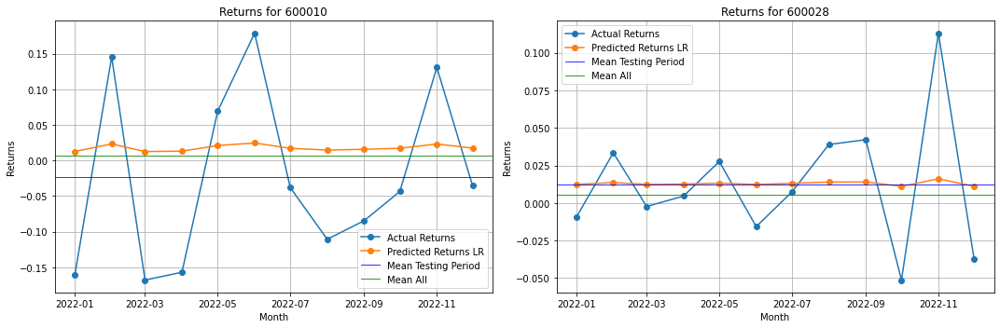

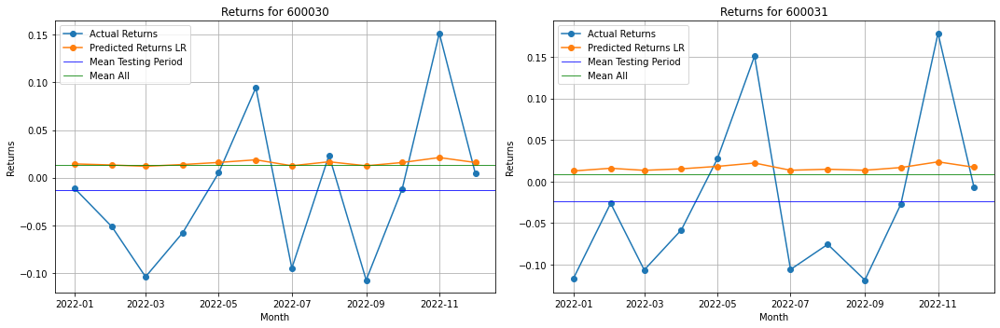

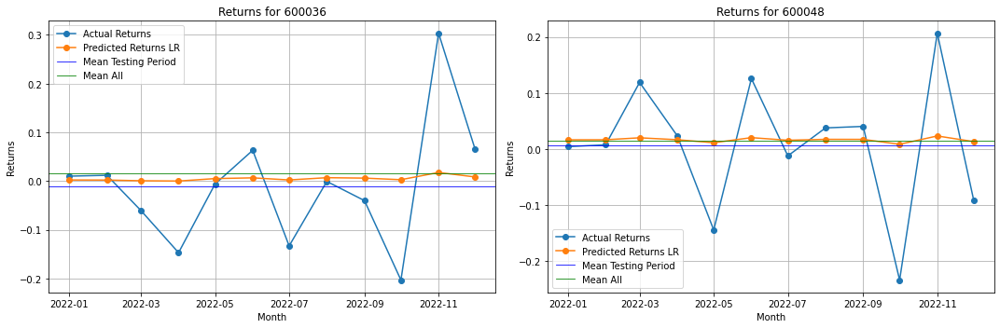

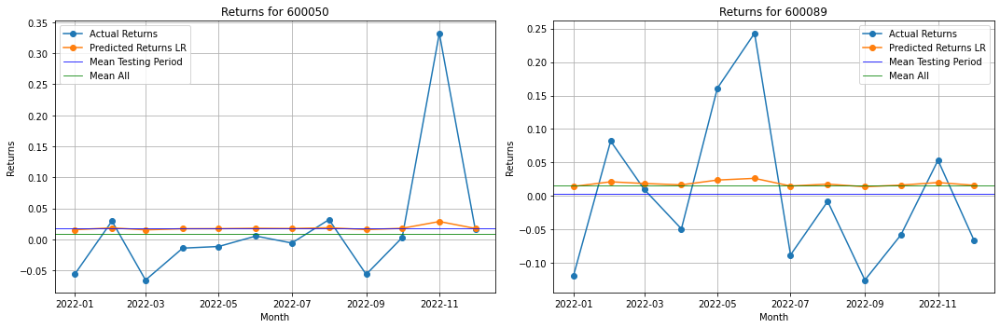

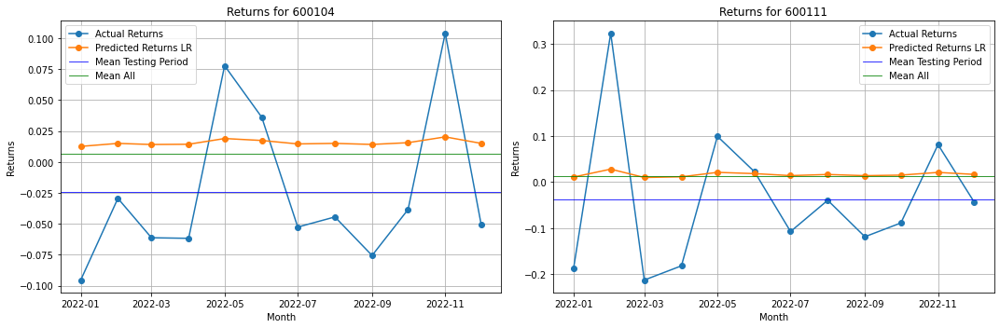

...

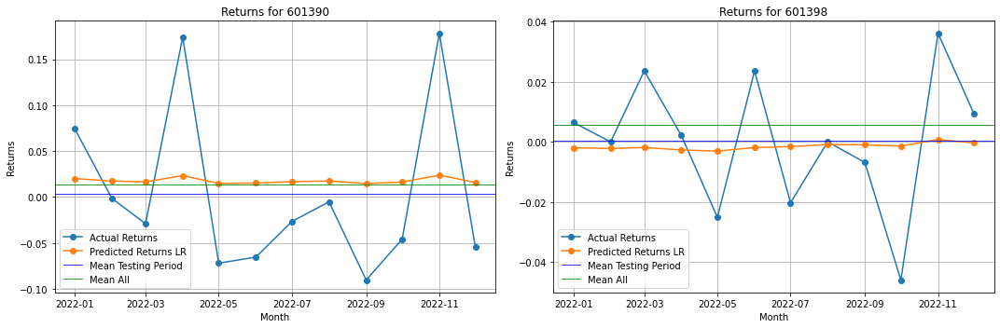

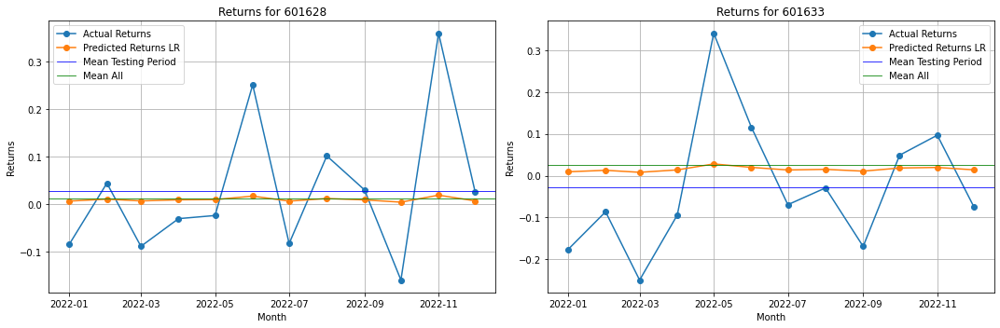

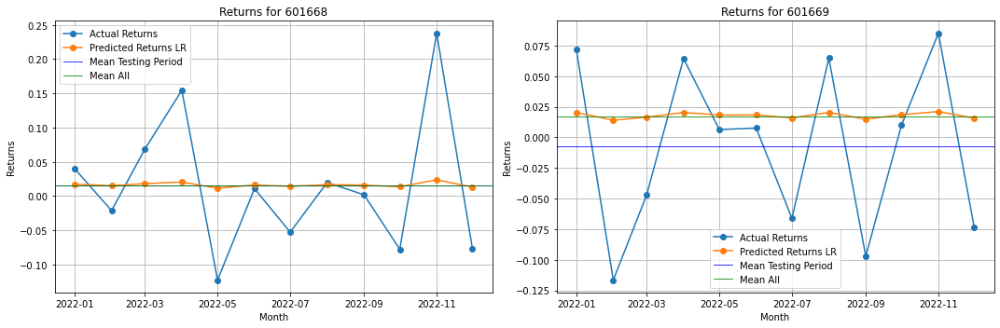

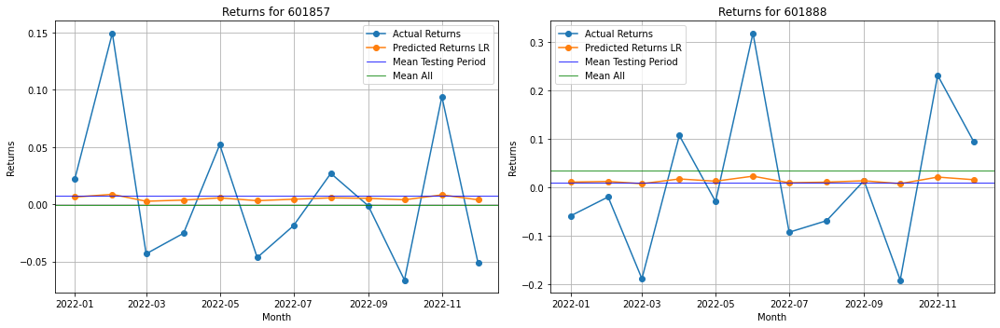

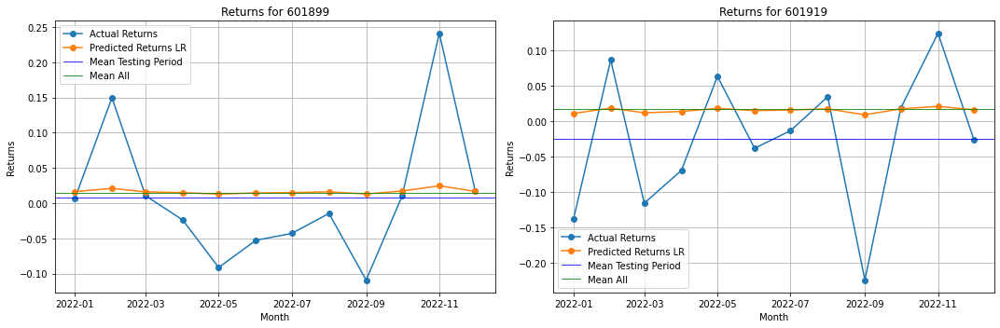

In [73]:
n_rows, n_cols = 1, 2

for i in range(0, len(testing_period.columns), 2):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5))
    axes = axes.flatten()
    
    for j in range(2):
        index = i + j
        if index >= len(testing_period.columns):
            break 
        
        ax = axes[j]
        stock = testing_period.columns[index]
        ax.plot(testing_period.index, testing_period[stock], marker='o', label='Actual Returns')
        ax.plot(testing_period.index, predicted_data[stock], marker='o', label='Predicted Returns LR')
        
        mean_actual = testing_period[stock].mean()
        ax.axhline(y=mean_actual, color='blue', linestyle='-', linewidth=0.8, label='Mean Testing Period')
        mean_all = data[stock].mean()
        ax.axhline(y=mean_all, color='green', linestyle='-', linewidth=0.8, label='Mean All')
        
        ax.set_title(f'Returns for {stock}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Returns')
        ax.grid(True)
        ax.legend()
        
    plt.tight_layout()
    plt.show()

In [74]:
test_period = ["2022-01", "2022-02", "2022-03", "2022-04", "2022-05", "2022-06", "2022-07", "2022-08", "2022-09", "2022-10", "2022-11", "2022-12"]

predicted_returns_LR = []
market_returns = []

for months in test_period:
    monthly_data = results_df[results_df["Trading Month"] == months]
    mean_returns = np.array(monthly_data["Predicted Returns"].values)
    
    end_date = months
    start_date = pd.to_datetime(end_date) - pd.DateOffset(years=1)
    start_date = pd.to_datetime(start_date)
    
    historical_data = data.loc[start_date:end_date].iloc[:-1]
    cov_matrix = historical_data.cov()
    
    actual_returns = data.loc[end_date].iloc[:-1]
    
    risk_free_rate = risk_free_df.loc[end_date]
    
       
    optimal_weights = maximize_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    optimal_weights/= sum(optimal_weights)
    
    actual_returns = data.loc[end_date].values
    mean_returns_god = historical_data.mean()
    
    predicted_returns = np.dot(actual_returns, optimal_weights)
    equal_weighted_returns = actual_returns.mean()
        
    predicted_returns_LR.append(predicted_returns)
    market_returns.append(equal_weighted_returns)

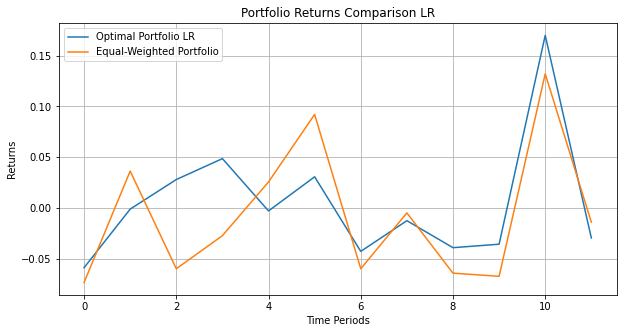

In [75]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

ax.plot(predicted_returns_LR, label='Optimal Portfolio LR')
ax.plot(market_returns, label='Equal-Weighted Portfolio')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison LR')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.grid(True)
plt.show()


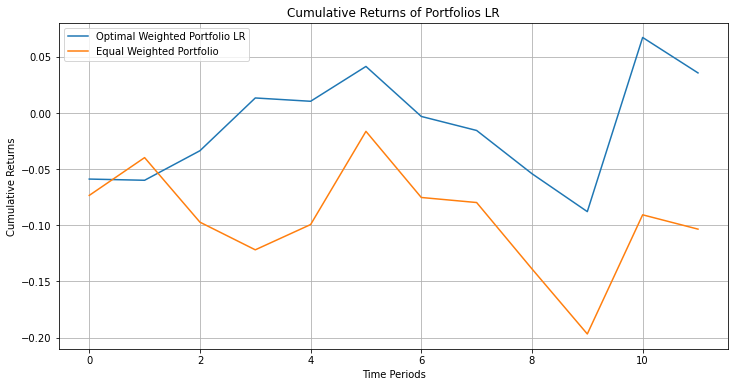

In [77]:
cumulative_returns_LR = np.cumprod(1 + np.array(predicted_returns_LR)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns_LR, label='Optimal Weighted Portfolio LR')
plt.plot(cumulative_returns_equal, label='Equal Weighted Portfolio')
plt.title('Cumulative Returns of Portfolios LR')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid(True)
plt.show()

# All Model Comparison

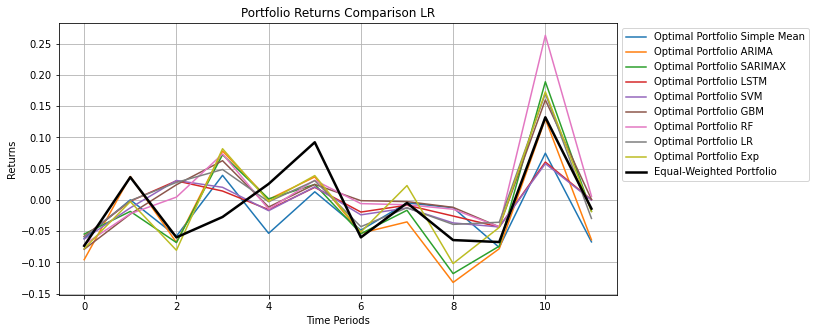

In [78]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
ax = plt.subplot(111)


ax.plot(predicted_returns_mean, label = 'Optimal Portfolio Simple Mean')
ax.plot(predicted_returns_arima, label = 'Optimal Portfolio ARIMA')
ax.plot(predicted_returns_SARIMAX, label='Optimal Portfolio SARIMAX')
ax.plot(predicted_returns_LSTM, label='Optimal Portfolio LSTM')
ax.plot(predicted_returns_SVM, label='Optimal Portfolio SVM')
ax.plot(predicted_returns_GBM, label='Optimal Portfolio GBM')
ax.plot(predicted_returns_RF, label='Optimal Portfolio RF')
ax.plot(predicted_returns_LR, label='Optimal Portfolio LR')
ax.plot(predicted_returns_exp, label='Optimal Portfolio Exp')
ax.plot(market_returns, label='Equal-Weighted Portfolio',linewidth=2.5, linestyle='-', color='black')

plt.xlabel('Time Periods')
plt.ylabel('Returns')
plt.title('Portfolio Returns Comparison LR')

# Add a legend to the plot
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot
plt.grid(True)
plt.show()


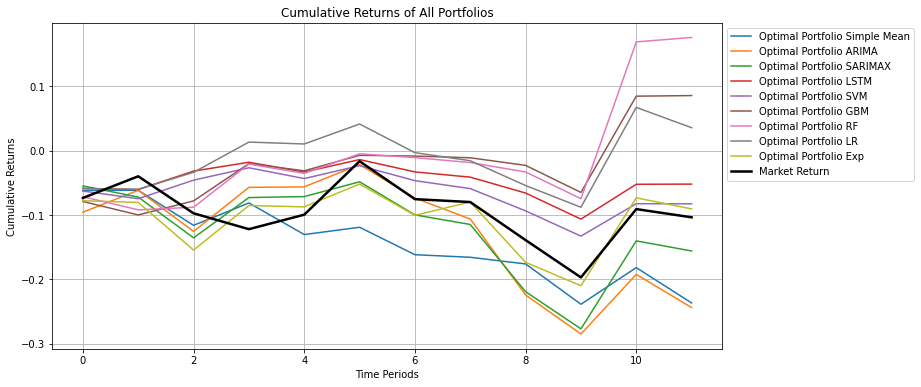

In [79]:
cumulative_returns_LR = np.cumprod(1 + np.array(predicted_returns_LR)) - 1
cumulative_returns_equal = np.cumprod(1 + np.array(market_returns)) - 1

# Plot cumulative returns
plt.figure(figsize=(12, 6))

plt.plot(cumulative_returns_mean, label='Optimal Portfolio Simple Mean')
plt.plot(cumulative_returns_ARIMA, label='Optimal Portfolio ARIMA')
plt.plot(cumulative_returns_SARIMAX, label='Optimal Portfolio SARIMAX')
plt.plot(cumulative_returns_LSTM, label='Optimal Portfolio LSTM')
plt.plot(cumulative_returns_SVM, label='Optimal Portfolio SVM')
plt.plot(cumulative_returns_GBM, label='Optimal Portfolio GBM')
plt.plot(cumulative_returns_rf, label='Optimal Portfolio RF')
plt.plot(cumulative_returns_LR, label='Optimal Portfolio LR')
plt.plot(cumulative_returns_exp, label='Optimal Portfolio Exp')
plt.plot(cumulative_returns_equal, label='Market Return',linewidth=2.5, linestyle='-', color='black')

plt.title('Cumulative Returns of All Portfolios')
plt.xlabel('Time Periods')
plt.ylabel('Cumulative Returns')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

In [80]:
print("Final Cumulative Returns ")
print("ARIMA                  :",cumulative_returns_ARIMA[-1])
print("Simple Mean            :",cumulative_returns_mean[-1])
print("SARIMAX                :",cumulative_returns_SARIMAX[-1])
print("Market Return          :",cumulative_returns_equal[-1])
print("Exponential Smoothing  :",cumulative_returns_exp[-1])
print("SVM                    :",cumulative_returns_SVM[-1])
print("LSTM                   :",cumulative_returns_LSTM[-1])
print("Linear Regression      :",cumulative_returns_LR[-1])
print("GBM                    :",cumulative_returns_GBM[-1])
print("Random Forest          :",cumulative_returns_rf[-1])



Final Cumulative Returns 
ARIMA                  : -0.2436942325821847
Simple Mean            : -0.23650128981019125
SARIMAX                : -0.15575594113950597
Market Return          : -0.10344144224650875
Exponential Smoothing  : -0.0903985372848991
SVM                    : -0.08249145555763393
LSTM                   : -0.05189191530285808
Linear Regression      : 0.0357402929015731
GBM                    : 0.08566223766447356
Random Forest          : 0.17592660511426317
